<a href="https://colab.research.google.com/github/calvinadoho/Projet-ML-TNT/blob/main/Traitement_TNT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from google.colab import drive
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
os.listdir("/gdrive/MyDrive/Résultats TNT")

['Base_Complete_avec_RxPower_dBm_New.xlsx',
 'Data_remplies.csv',
 'data_encoded.csv',
 'base_équilibrée.csv']

In [ ]:
Data=pd.read_excel("/gdrive/MyDrive/Résultats TNT/Base_Complete_avec_RxPower_dBm_New.xlsx")

In [ ]:
Data

,Rx_id,City,Rx_alt,Slope,Rx_roughness,Rx_height,Freq,E_field,Temp,Rhum,...,Tx_power,Distance,Building_count,Tx_to_building,Blocked_LOS,Rx_lat,Rx_lon,Tx_height,Rx_power,Rx_power_dBm
0,Cotonou_111,Cotonou,7,23.074382,7.399903,10,570,77.00,29.0,43,...,21238,6.356997,4,953.162701,1,6.37272,2.34774,167,NaN,NaN
1,Cotonou_112,Cotonou,5,22.355982,7.166216,10,570,61.50,31.1,39,...,21238,6.111417,33,973.187892,1,6.37114,2.35104,109,NaN,NaN
2,Cotonou_113,Cotonou,5,22.658038,7.241276,10,570,67.60,33.0,36,...,21238,6.503809,34,975.067752,1,6.36991,2.34688,109,NaN,NaN
3,Cotonou_121,Cotonou,7,23.597164,7.621815,10,570,70.60,28.4,51,...,21238,5.962326,6,958.696397,1,6.37635,2.34974,167,66.1,-42.650613
4,Cotonou_122,Cotonou,6,22.784896,7.314125,10,570,NaN,28.4,51,...,21238,6.283724,28,950.584562,1,6.37262,2.34993,109,49.3,-59.450613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348,Kandi_351,Kandi,285,57.446231,23.241646,10,538,77.70,28.4,37,...,7079,6.065022,1,992.995741,1,11.13861,2.90130,427,73.0,-35.750613
349,Kandi_353,Kandi,287,57.423356,23.024153,10,538,78.50,28.4,37,...,7079,5.560403,0,5560.402896,0,11.13802,2.90594,427,73.9,-34.850613
350,Kandi_352,Kandi,287,57.399402,23.069267,10,538,83.60,28.4,37,...,7079,5.629393,0,5629.392781,0,11.13916,2.90564,427,79.0,-29.750613
351,Kandi_3103,Kandi,292,57.317816,23.109159,10,538,83.30,28.4,37,...,7079,5.636952,0,5636.952345,0,11.14124,2.90630,427,78.7,-30.050613


In [ ]:
Data.shape

(353, 30)

In [ ]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353 entries, 0 to 352
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Rx_id           353 non-null    object 
 1   City            353 non-null    object 
 2   Rx_alt          353 non-null    int64  
 3   Slope           353 non-null    float64
 4   Rx_roughness    353 non-null    float64
 5   Rx_height       353 non-null    int64  
 6   Freq            353 non-null    int64  
 7   E_field         352 non-null    float64
 8   Temp            353 non-null    float64
 9   Rhum            353 non-null    int64  
 10  Prcp            353 non-null    float64
 11  Wdir            353 non-null    int64  
 12  Wspd            353 non-null    float64
 13  Pres            353 non-null    float64
 14  Tilt            353 non-null    float64
 15  Azimuth         353 non-null    float64
 16  Env             353 non-null    object 
 17  Tx_id           353 non-null    obj

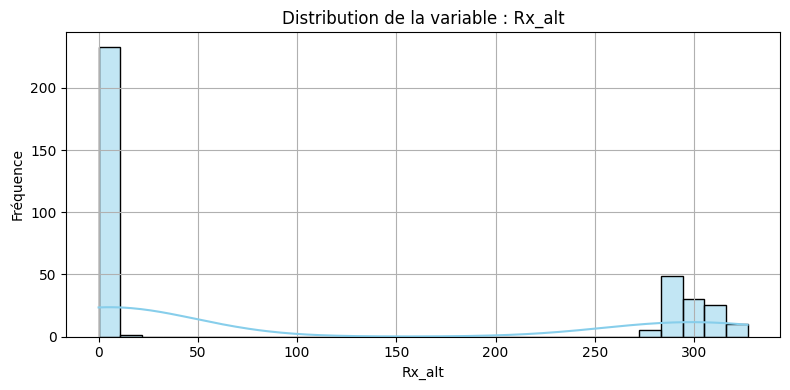

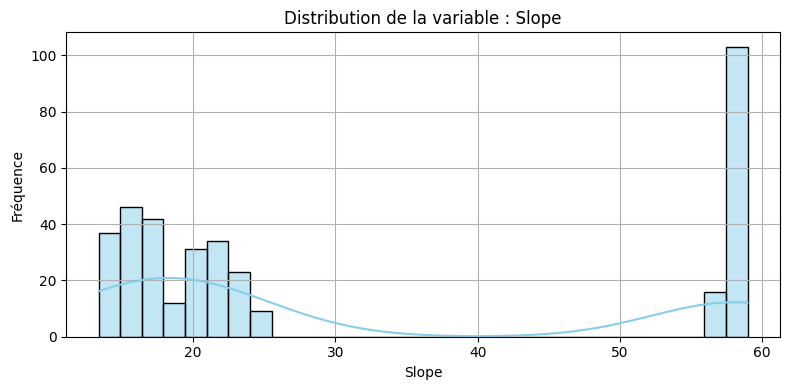

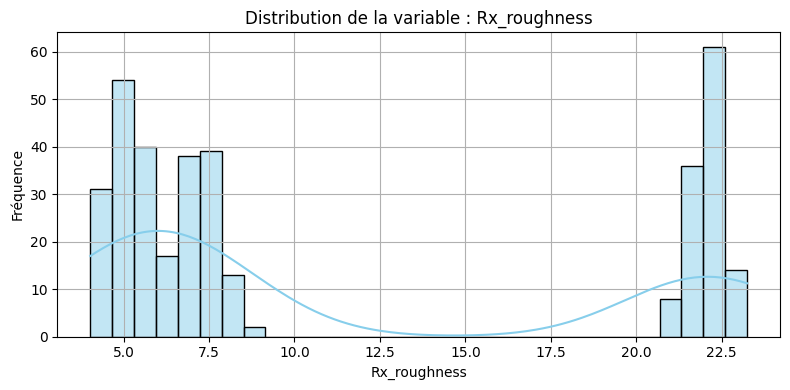

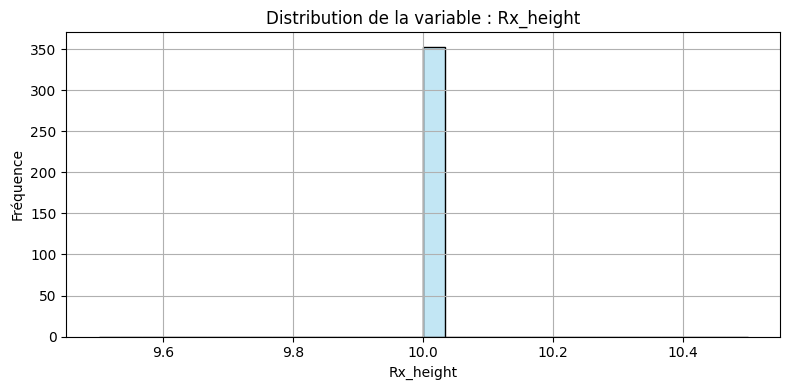

In [ ]:
# Sélectionner uniquement les colonnes numériques
numerical_cols = Data.select_dtypes(include=['float64', 'int64']).columns

# Affichage des histogrammes avec Seaborn
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(Data[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution de la variable : {col}')
    plt.xlabel(col)
    plt.ylabel('Fréquence')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Sélectionner les colonnes catégorielles
categorical_cols = Data.select_dtypes(include=['object', 'category']).columns

for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(data=Data, x=col, palette='viridis')
    plt.title(f'Distribution de la variable : {col}')
    plt.xlabel(col)
    plt.ylabel('Nombre d\'observations')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

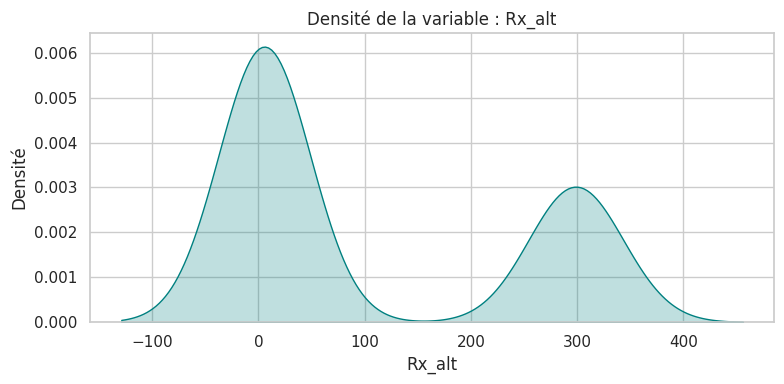

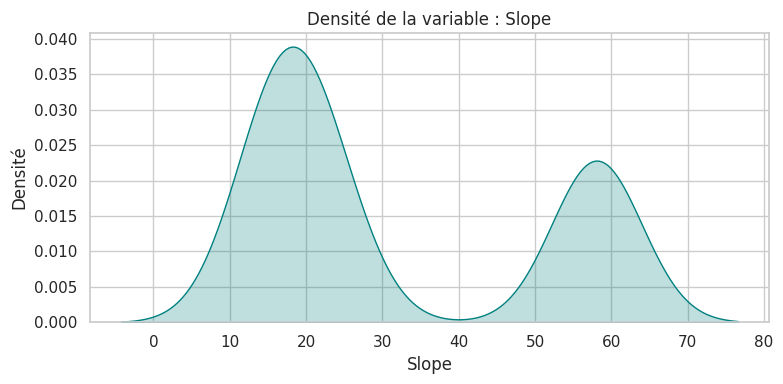

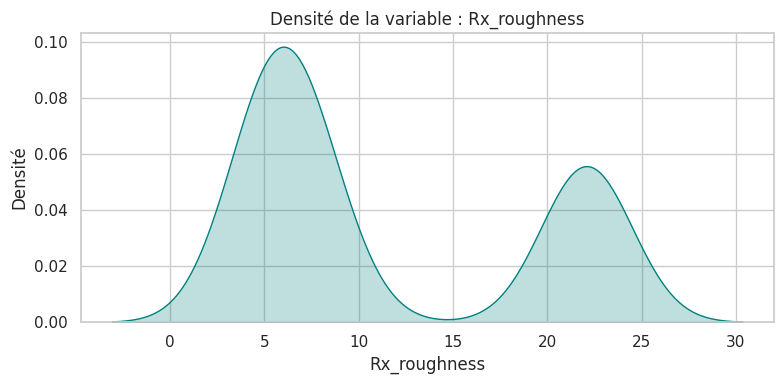

<ipython-input-18-d51261424c92>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=Data, x=col, fill=True, color="teal", bw_adjust=1)


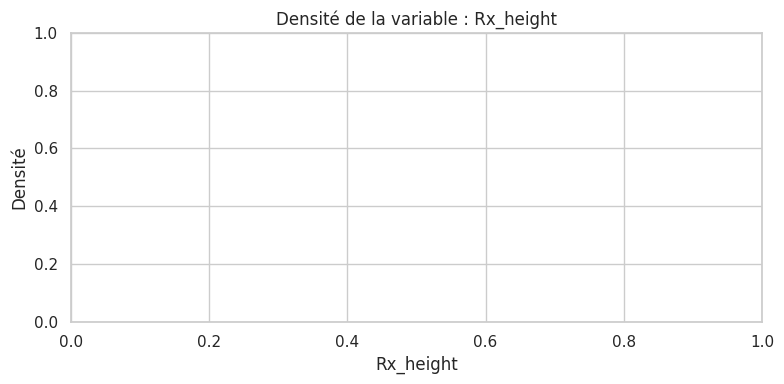

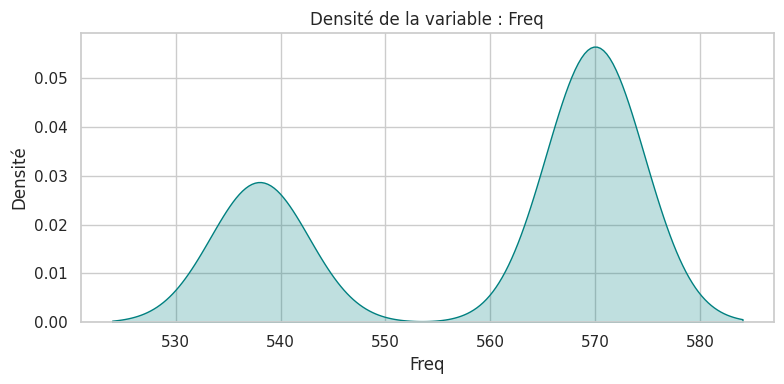

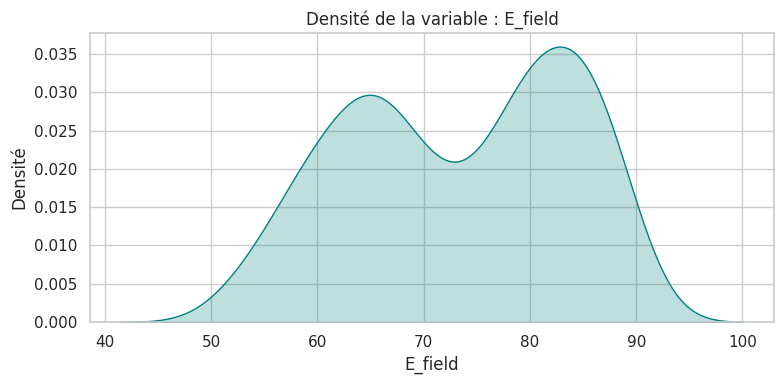

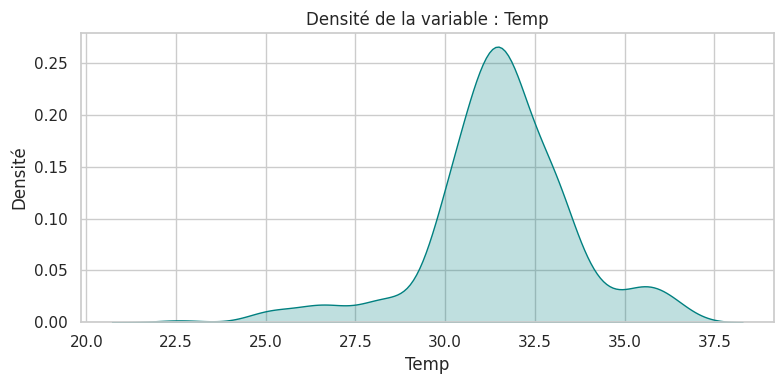

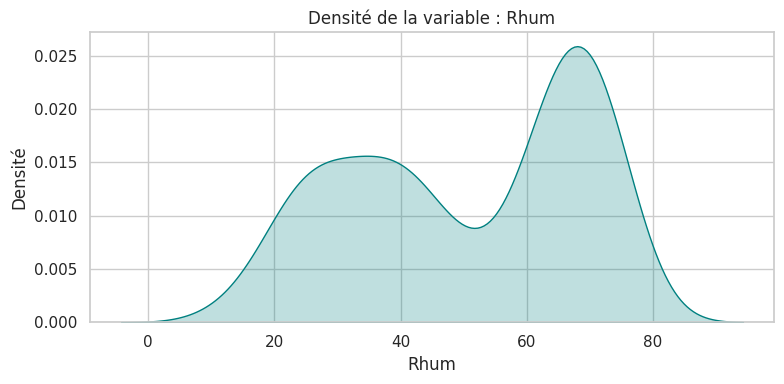

...

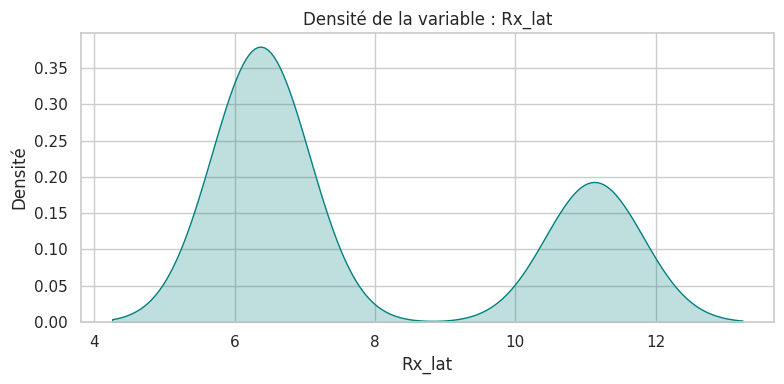

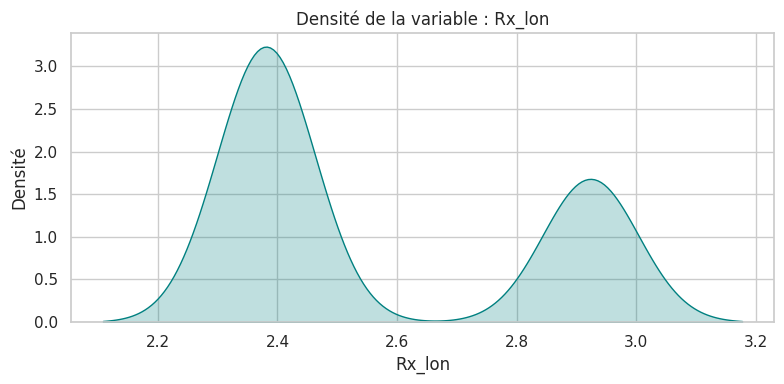

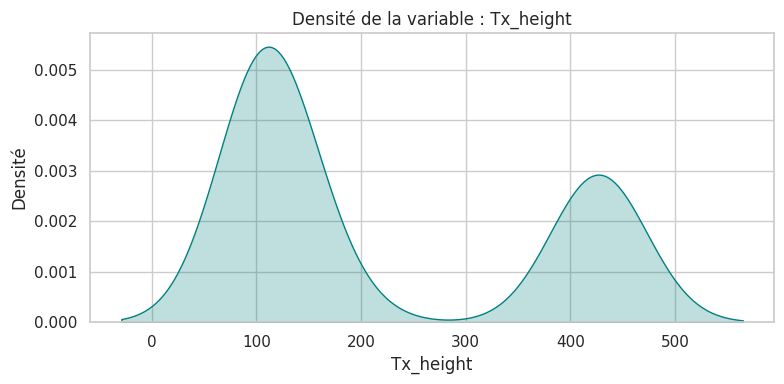

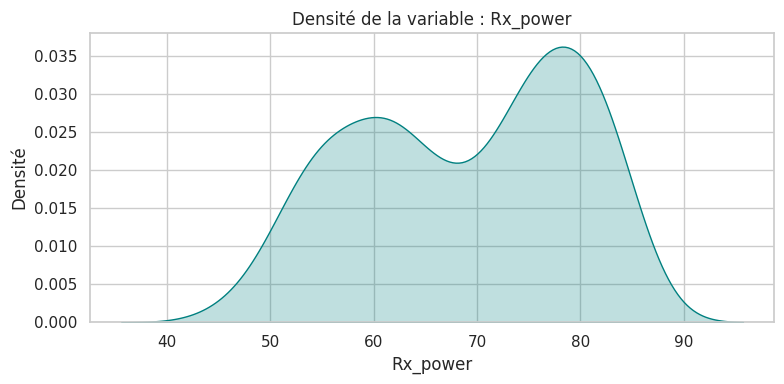

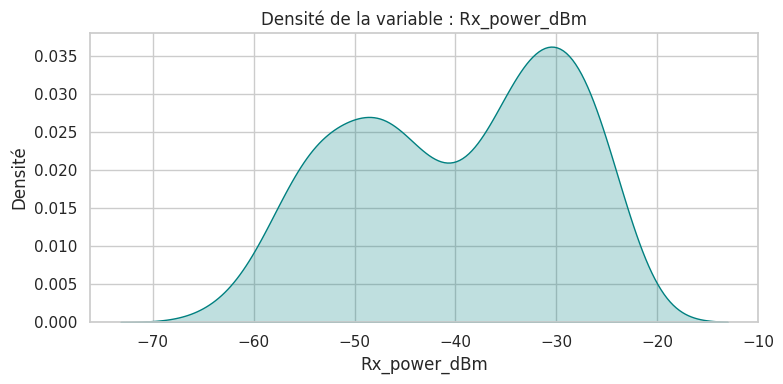

In [ ]:
# Sélectionner les colonnes numériques
numerical_cols = Data.select_dtypes(include=['float64', 'int64']).columns

# Style seaborn
sns.set(style="whitegrid")

# Tracer la courbe de densité pour chaque variable
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=Data, x=col, fill=True, color="teal", bw_adjust=1)
    plt.title(f'Densité de la variable : {col}')
    plt.xlabel(col)
    plt.ylabel('Densité')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


**GESTION DES VALEURS MANQUANTES**

In [ ]:
Data.isna().sum(axis=0)

,0
Rx_id,0
City,0
Rx_alt,0
Slope,0
Rx_roughness,0
Rx_height,0
Freq,0
E_field,1
Temp,0
Rhum,0


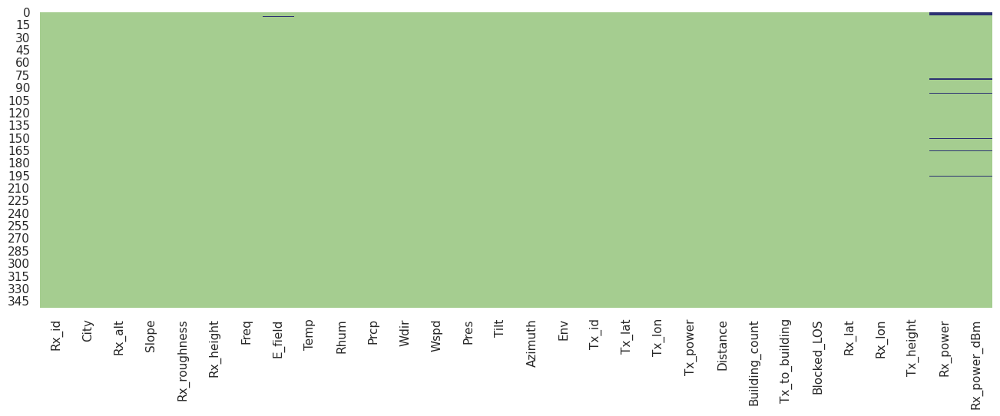

In [ ]:
plt.figure(figsize=(16,5))
sns.heatmap(Data.isna(),cmap="crest", cbar=False);

In [ ]:
# Création d'une copie du DataFrame original pour ne pas modifier les données de base
Data_remplies = Data.copy()

# Imputation des valeurs manquantes par la moyenne pour chaque variable
Data_remplies['E_field'] = Data_remplies['E_field'].fillna(Data_remplies['E_field'].mean())
Data_remplies['Rx_power'] = Data_remplies['Rx_power'].fillna(Data_remplies['Rx_power'].mean())
Data_remplies['Rx_power_dBm'] = Data_remplies['Rx_power_dBm'].fillna(Data_remplies['Rx_power_dBm'].mean())
# Sauvegarde du DataFrame dans un fichier CSV
Data_remplies.to_csv("/gdrive/MyDrive/Résultats TNT/Data_remplies.csv", index=False)

Data_remplies.isna().sum(axis=0)

,0
Rx_id,0
City,0
Rx_alt,0
Slope,0
Rx_roughness,0
Rx_height,0
Freq,0
E_field,0
Temp,0
Rhum,0


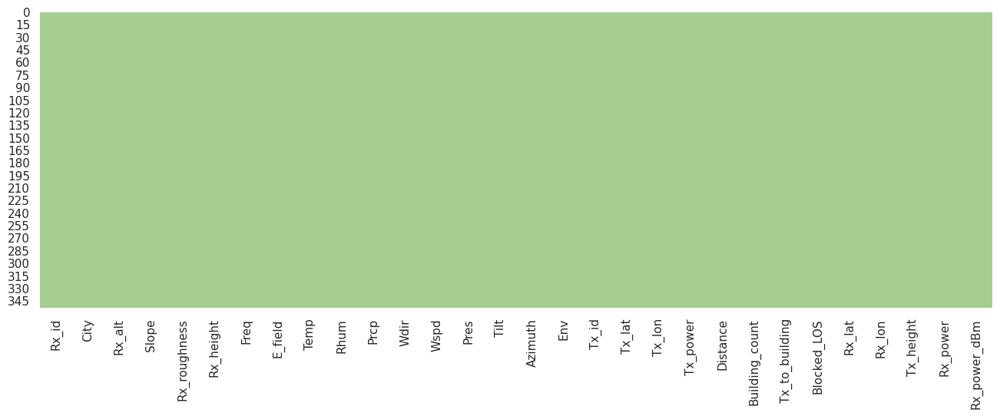

In [ ]:
plt.figure(figsize=(16,5))
sns.heatmap(Data_remplies.isna(),cmap="crest", cbar=False);

**ENCODAGE DES VARIABLES CATEGORIELLES**

In [ ]:
data_encoded = Data_remplies.copy()
le = LabelEncoder()  # Initialise un encodeur de labels
data_encoded['City'] = le.fit_transform(data_encoded['City'])  # Convertit les villes en nombres
data_encoded['Env'] = le.fit_transform(data_encoded['Env'])    # Convertit les environnements en nombres
data_encoded['Tx_id'] = le.fit_transform(data_encoded['Tx_id'])  # Convertit les IDs d'émetteurs en nombres
data_encoded.to_csv("/gdrive/MyDrive/Résultats TNT/data_encoded.csv", index=False)
data_encoded

,Rx_id,City,Rx_alt,Slope,Rx_roughness,Rx_height,Freq,E_field,Temp,Rhum,...,Tx_power,Distance,Building_count,Tx_to_building,Blocked_LOS,Rx_lat,Rx_lon,Tx_height,Rx_power,Rx_power_dBm
0,Cotonou_111,0,7,23.074382,7.399903,10,570,77.000000,29.0,43,...,21238,6.356997,4,953.162701,1,6.37272,2.34774,167,68.925507,-39.825105
1,Cotonou_112,0,5,22.355982,7.166216,10,570,61.500000,31.1,39,...,21238,6.111417,33,973.187892,1,6.37114,2.35104,109,68.925507,-39.825105
2,Cotonou_113,0,5,22.658038,7.241276,10,570,67.600000,33.0,36,...,21238,6.503809,34,975.067752,1,6.36991,2.34688,109,68.925507,-39.825105
3,Cotonou_121,0,7,23.597164,7.621815,10,570,70.600000,28.4,51,...,21238,5.962326,6,958.696397,1,6.37635,2.34974,167,66.100000,-42.650613
4,Cotonou_122,0,6,22.784896,7.314125,10,570,73.382955,28.4,51,...,21238,6.283724,28,950.584562,1,6.37262,2.34993,109,49.300000,-59.450613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348,Kandi_351,1,285,57.446231,23.241646,10,538,77.700000,28.4,37,...,7079,6.065022,1,992.995741,1,11.13861,2.90130,427,73.000000,-35.750613
349,Kandi_353,1,287,57.423356,23.024153,10,538,78.500000,28.4,37,...,7079,5.560403,0,5560.402896,0,11.13802,2.90594,427,73.900000,-34.850613
350,Kandi_352,1,287,57.399402,23.069267,10,538,83.600000,28.4,37,...,7079,5.629393,0,5629.392781,0,11.13916,2.90564,427,79.000000,-29.750613
351,Kandi_3103,1,292,57.317816,23.109159,10,538,83.300000,28.4,37,...,7079,5.636952,0,5636.952345,0,11.14124,2.90630,427,78.700000,-30.050613


**PROPORTION DE DONNEES DANS CHAQUE VILLE**

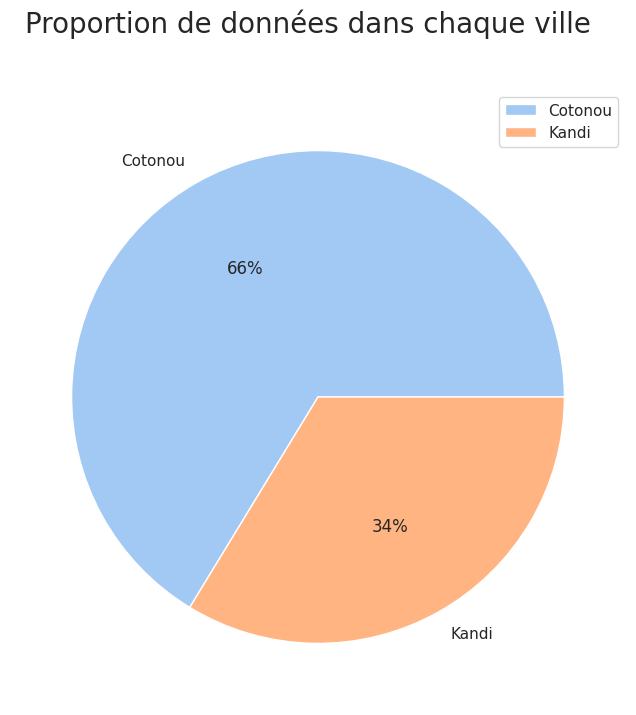

In [ ]:
plt.figure(figsize = (8,8)).suptitle('Proportion de données dans chaque ville', fontsize=20)
labels = ['Cotonou' if v == 0 else 'Kandi' for v in data_encoded.City.value_counts().index]

#définir la palette de couleurs
colors = sns.color_palette('pastel')[0:5]

#créer un diagramme circulaire
plt.pie(data_encoded.City.value_counts().values, labels=labels, colors=colors, autopct='%.0f%%')
plt.legend()
plt.show()

In [ ]:
data_encoded['City'].value_counts()

,count
City,
0,234
1,119


**EQUILIBRAGE DES CLASSES AVEC SMOTE**

In [ ]:
#Colonnes à exclure du traitement
excluded_cols = ['Rx_id', 'Tx_lat', 'Tx_lon', 'Rx_lat', 'Rx_lon']

#Préparation des données
features = data_encoded.drop(columns=excluded_cols)
X = features.drop(columns=['City'])
y = features['City']

#SMOTE sur la classe minoritaire uniquement
smote = SMOTE(k_neighbors=2, sampling_strategy={1: y.value_counts()[0]}, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

#Reconstituer DataFrame SMOTE
Data_SMOTE = pd.DataFrame(X_resampled, columns=X.columns)
Data_SMOTE['City'] = y_resampled

#Remise des bonnes valeurs fixes pour les données synthétiques de Kandi
mask_kandi = Data_SMOTE['City'] == 1
Data_SMOTE.loc[mask_kandi, 'Freq'] = 538
Data_SMOTE.loc[mask_kandi, 'Tx_power'] = 7079
Data_SMOTE.loc[mask_kandi, 'Tx_height'] = 427
Data_SMOTE.loc[mask_kandi, 'Tx_id'] = 2  # déjà encodé
Data_SMOTE.loc[mask_kandi, 'Env'] = 0    # déjà encodé

#Création de la base équilibrée sans les colonnes exclues
data_équilibrée = Data_SMOTE.copy()

#Sauvegarde
chemin_sortie = "/gdrive/MyDrive/Résultats TNT/base_équilibrée.csv"
data_équilibrée.to_csv(chemin_sortie, index=False)

# 11. Vérification des classes
print("Données équilibrées sauvegardées ici :", chemin_sortie)
print(data_équilibrée['City'].value_counts())

Données équilibrées sauvegardées ici : /gdrive/MyDrive/Résultats TNT/base_équilibrée.csv
City
0    234
1    234
Name: count, dtype: int64


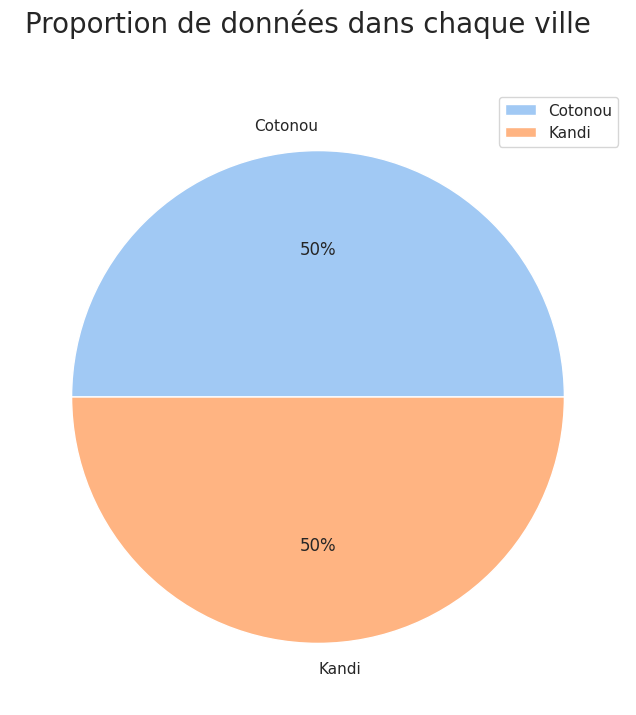

In [ ]:
plt.figure(figsize = (8,8)).suptitle('Proportion de données dans chaque ville', fontsize=20)
labels = ['Cotonou' if v == 0 else 'Kandi' for v in data_équilibrée.City.value_counts().index]

#définir la palette de couleurs
colors = sns.color_palette('pastel')[0:5]

#créer un diagramme circulaire
plt.pie(data_équilibrée.City.value_counts().values, labels=labels, colors=colors, autopct='%.0f%%')
plt.legend()
plt.show()

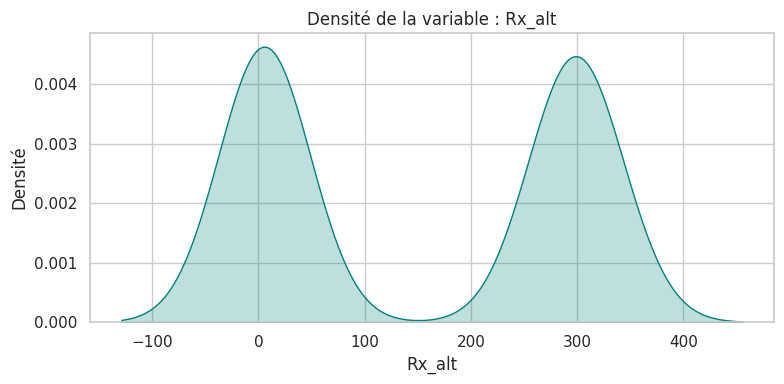

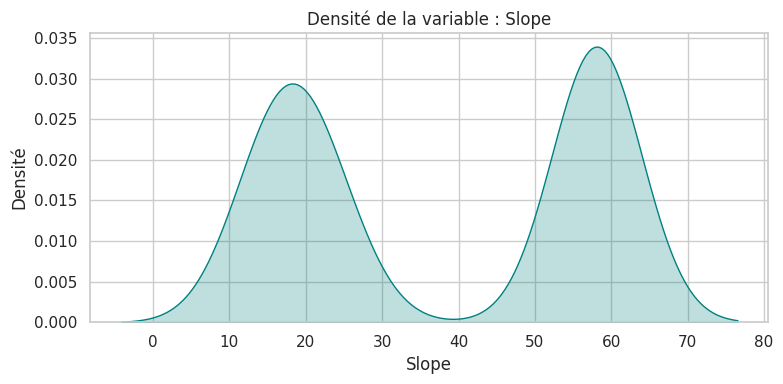

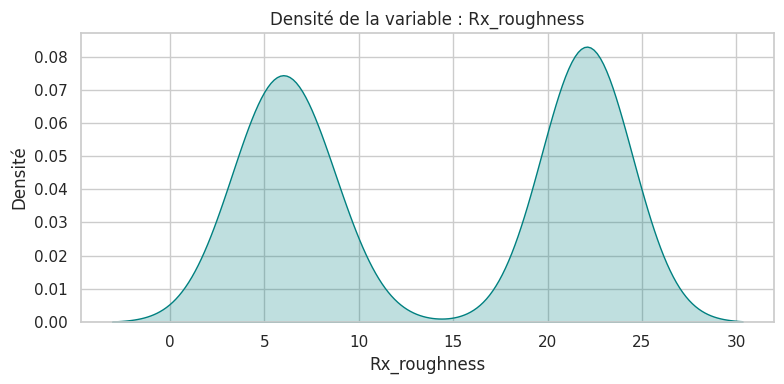

<ipython-input-28-9e3ea8123ec6>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=data_équilibrée, x=col, fill=True, color="teal", bw_adjust=1)


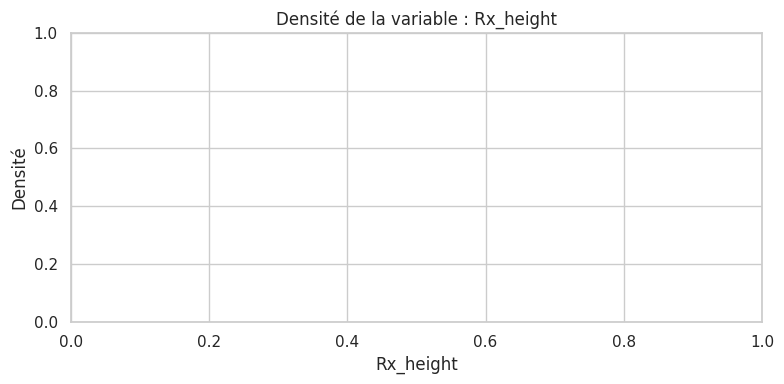

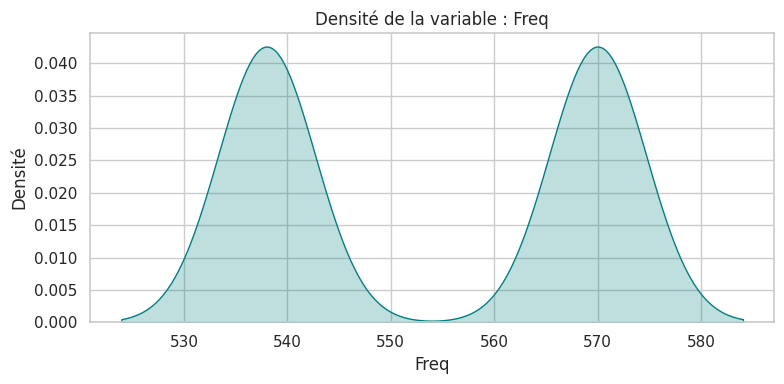

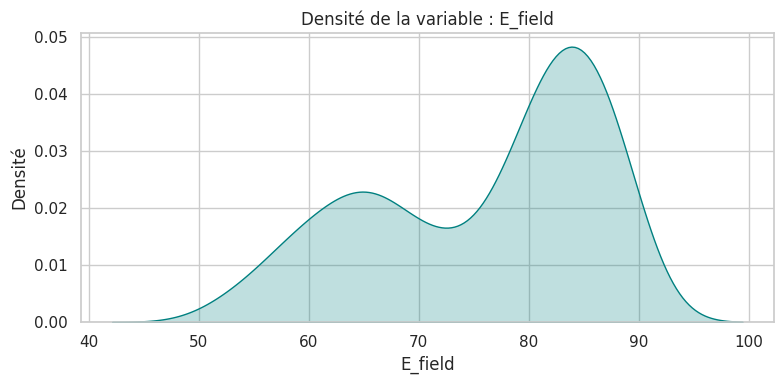

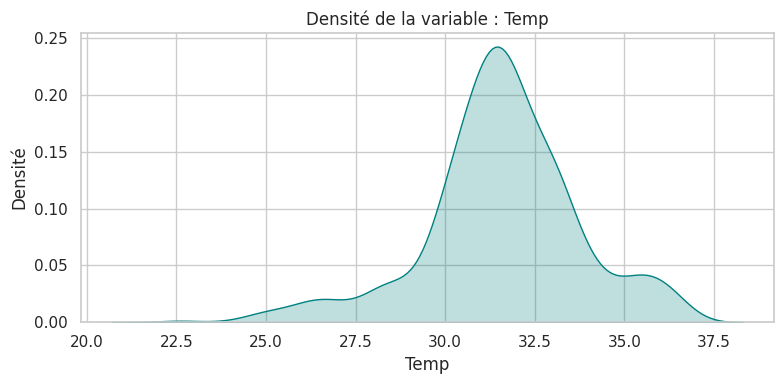

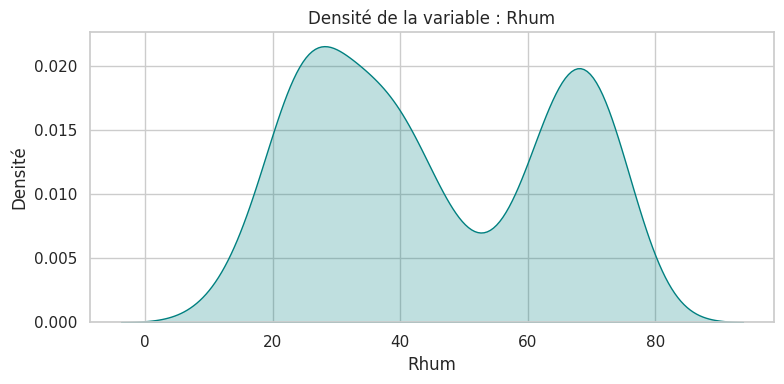

...

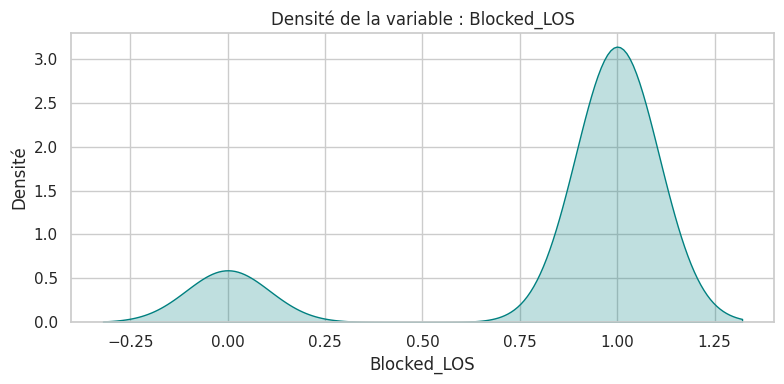

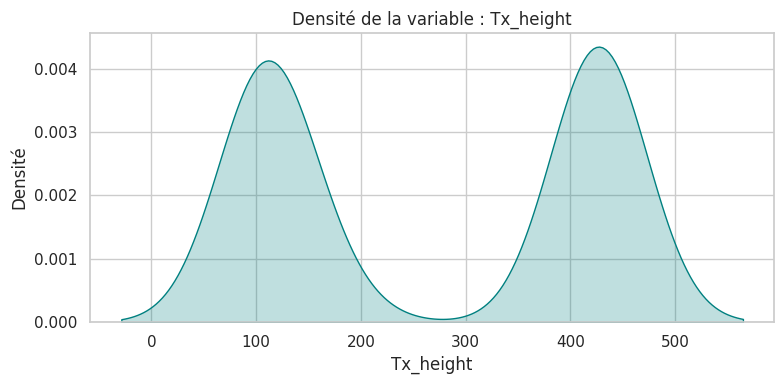

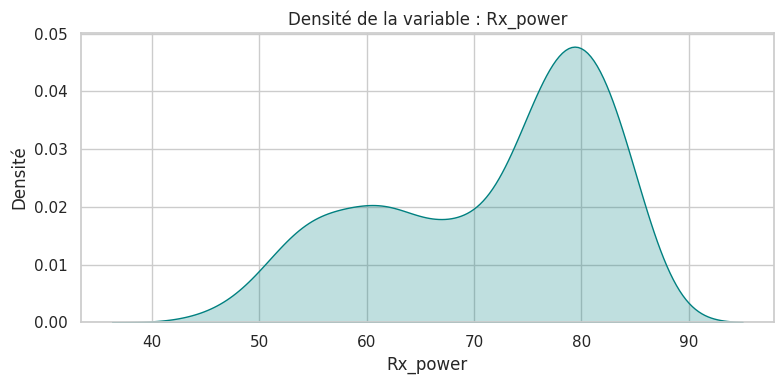

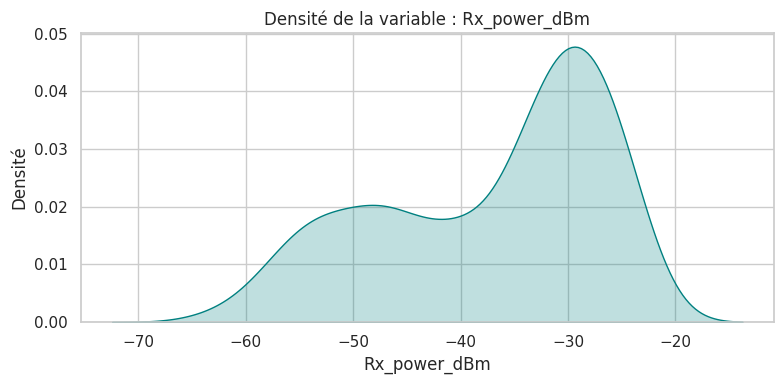

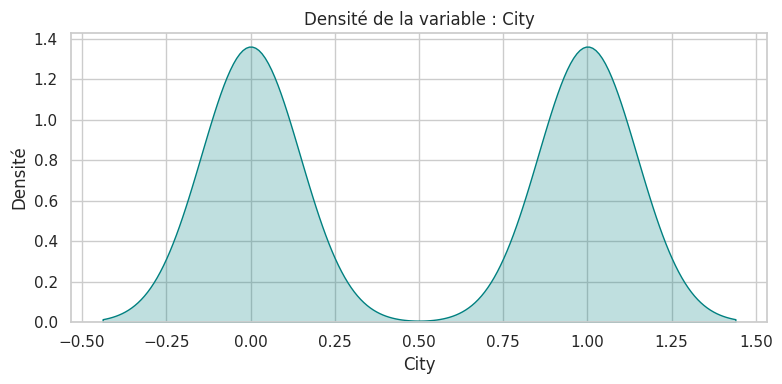

In [ ]:
# Sélectionner les colonnes numériques
numerical_cols = data_équilibrée.select_dtypes(include=['float64', 'int64']).columns

# Style seaborn
sns.set(style="whitegrid")

# Tracer la courbe de densité pour chaque variable
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data_équilibrée, x=col, fill=True, color="teal", bw_adjust=1)
    plt.title(f'Densité de la variable : {col}')
    plt.xlabel(col)
    plt.ylabel('Densité')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

**AUGMENTATION DE DONNEES A PLUS DE 10000 ECHANTILLONS AVEC CTGAN**

In [ ]:
!pip install sdv
!pip install ctgan

In [ ]:
from ctgan import CTGAN
# Colonnes catégorielles
discrete_cols = ['Tx_id', 'Env']

### === 1. PRÉPARATION PAR VILLE === ###

# --- KANDI ---
data_kandi = data_équilibrée[data_équilibrée['City'] == 1].copy()
data_kandi['Freq'] = 538
data_kandi['Tx_power'] = 7079
data_kandi['Tx_height'] = 427
data_kandi['Tx_id'] = 2
data_kandi['Env'] = 0
data_kandi['Prcp'] = 0
data_kandi = data_kandi.drop(columns=['City'])  # City sera réajouté après

# --- COTONOU ---
data_cotonou = data_équilibrée[data_équilibrée['City'] == 0].copy()
data_cotonou['Freq'] = 570
data_cotonou['Tx_power'] = 21238
data_cotonou['Tx_height'] = np.random.choice([109, 167], size=len(data_cotonou))
data_cotonou['Tx_id'] = np.random.choice([0, 1], size=len(data_cotonou))
data_cotonou['Env'] = 1
data_cotonou['Prcp'] = 0
data_cotonou = data_cotonou.drop(columns=['City'])

### === 2. ENTRAÎNEMENT CTGAN SÉPARÉ PAR VILLE === ###

ctgan_kandi = CTGAN(epochs=500, batch_size=512, pac=1)
ctgan_kandi.fit(data_kandi, discrete_columns=discrete_cols)

ctgan_cotonou = CTGAN(epochs=500, batch_size=512, pac=1)
ctgan_cotonou.fit(data_cotonou, discrete_columns=discrete_cols)

### === 3. GÉNÉRATION SÉCURISÉE DE SYNTHÉTIQUES === ###

def generate_valid_samples(ctgan_model, n_target, city_value):
    all_synthetic = pd.DataFrame()
    batch_size = 2000

    while len(all_synthetic) < n_target:
        batch = ctgan_model.sample(batch_size)

        # Nettoyage
        batch = batch.dropna()
        batch = batch.replace([np.inf, -np.inf], np.nan).dropna()
        batch = batch[~batch.duplicated()]

        batch['City'] = city_value
        all_synthetic = pd.concat([all_synthetic, batch], ignore_index=True)

    return all_synthetic.head(n_target)

synthetic_kandi = generate_valid_samples(ctgan_kandi, 5000, 1)
synthetic_cotonou = generate_valid_samples(ctgan_cotonou, 5000, 0)

# Fusion des deux
synthetic_all = pd.concat([synthetic_kandi, synthetic_cotonou], ignore_index=True)

# Nettoyage (optionnel)
cols_physiques = ['Distance', 'Temp', 'Humidity']
for col in cols_physiques:
    if col in synthetic_all.columns:
        synthetic_all[col] = synthetic_all[col].abs()

### === 4. FUSION AVEC LES DONNÉES RÉELLES === ###

data_finale = pd.concat([data_équilibrée, synthetic_all], ignore_index=True)

### === 5. SAUVEGARDE === ###

chemin_sortie = "/gdrive/MyDrive/Résultats TNT/Base_finale_CTGAN_10000.csv"
data_finale.to_csv(chemin_sortie, index=False)

### === 6. VÉRIFICATION === ###

print("✅ Génération + fusion terminée.")
print("📦 Taille finale :", len(data_finale))
print("📊 Répartition par ville :\n", data_finale['City'].value_counts())
print("💾 Base sauvegardée dans :", chemin_sortie)


✅ Génération + fusion terminée.
📦 Taille finale : 10468
📊 Répartition par ville :
 City
0    5234
1    5234
Name: count, dtype: int64
💾 Base sauvegardée dans : /gdrive/MyDrive/Résultats TNT/Base_finale_CTGAN_10000.csv


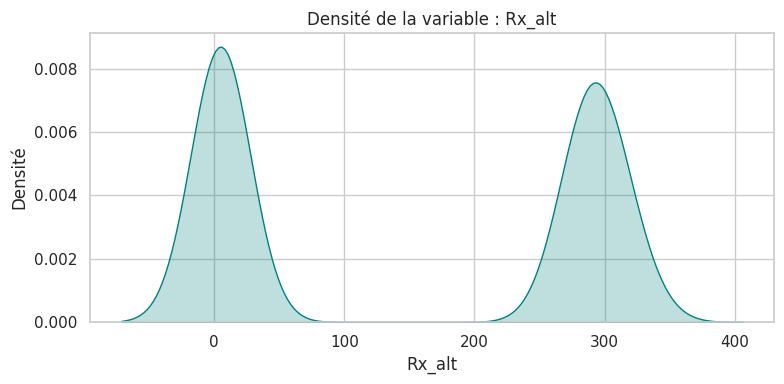

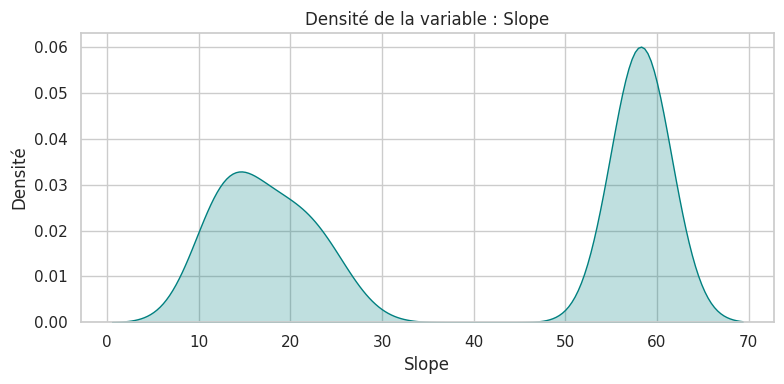

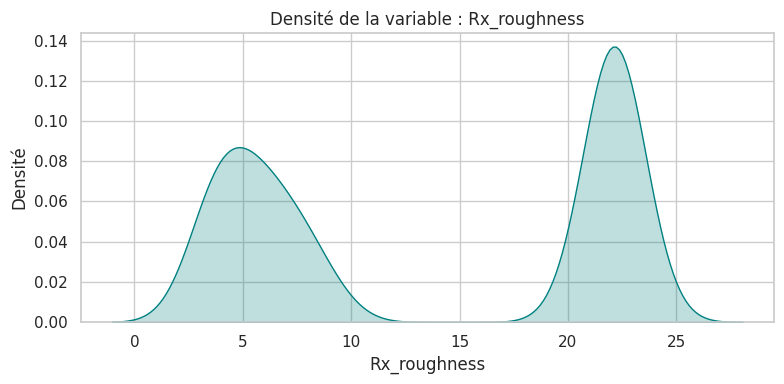

<ipython-input-42-308e1d7b3b06>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=data_finale, x=col, fill=True, color="teal", bw_adjust=1)


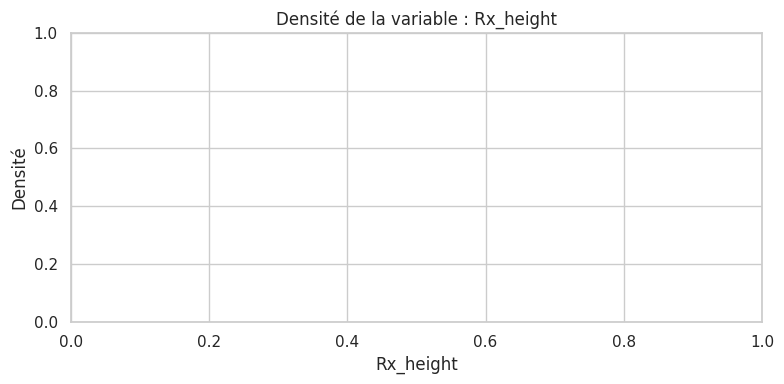

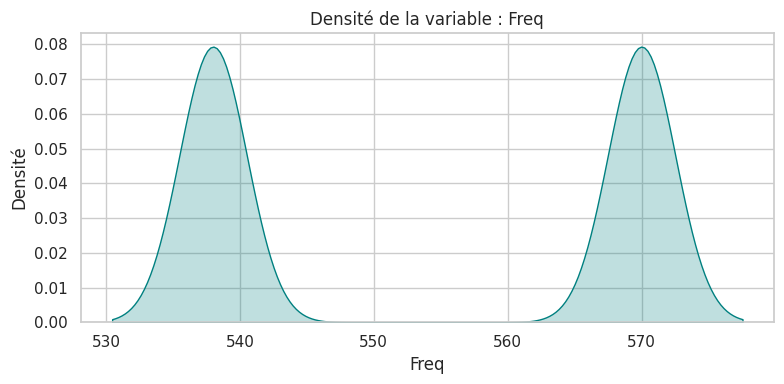

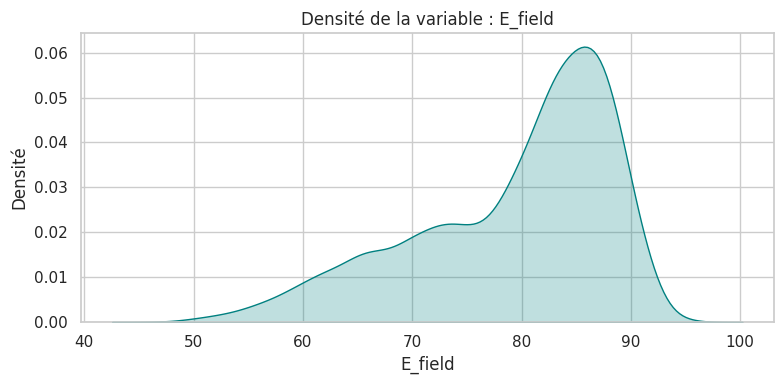

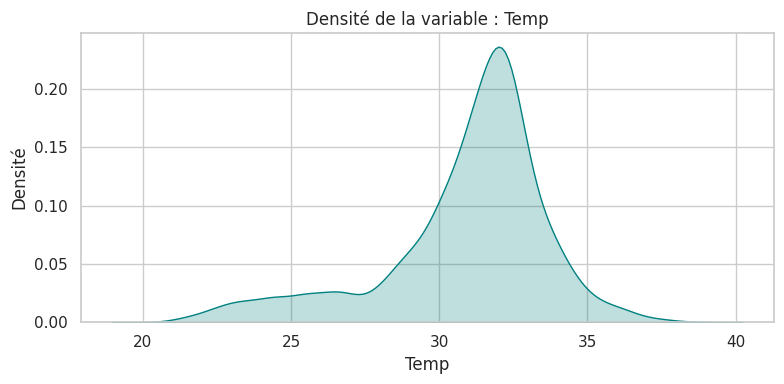

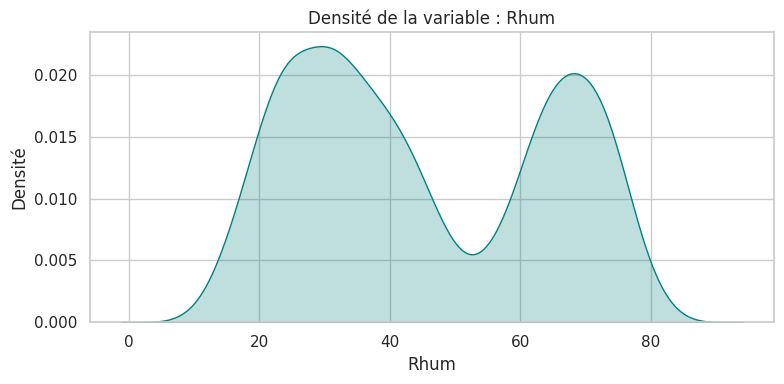

...

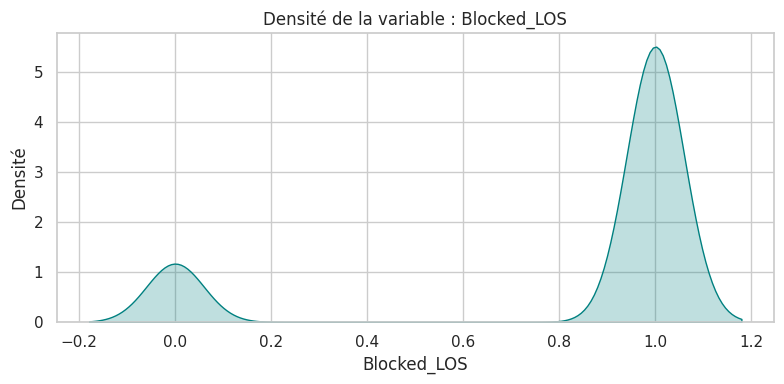

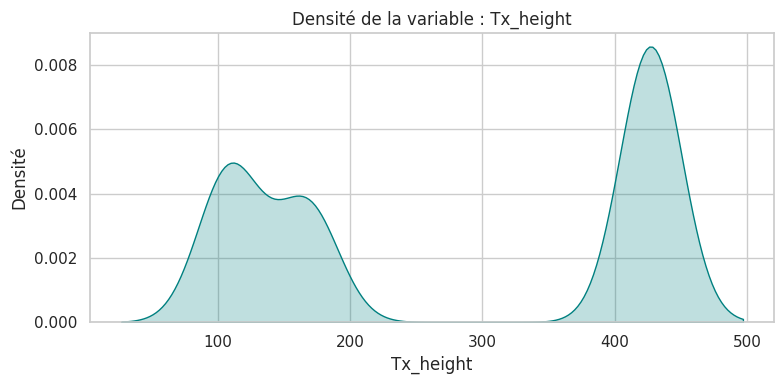

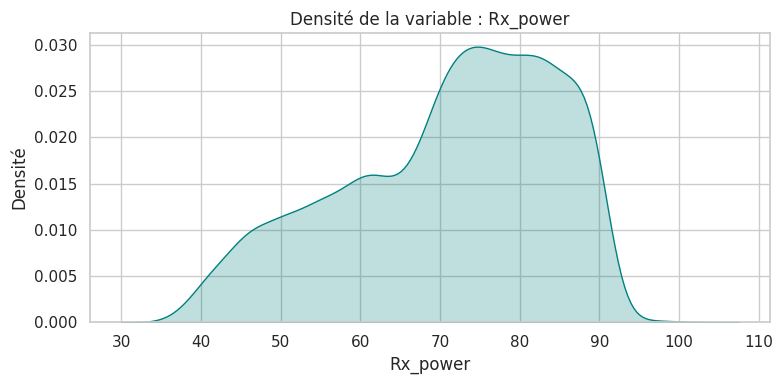

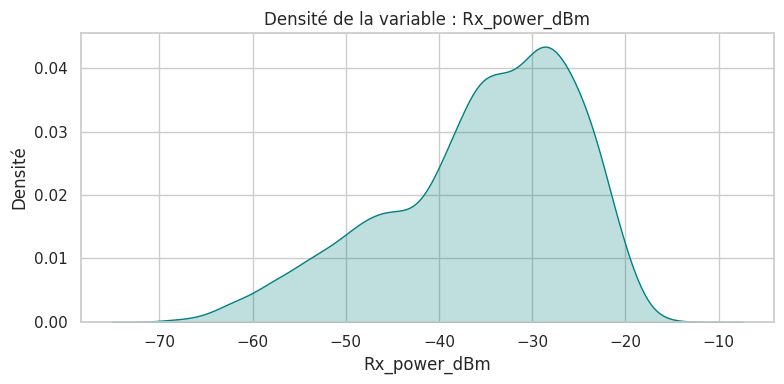

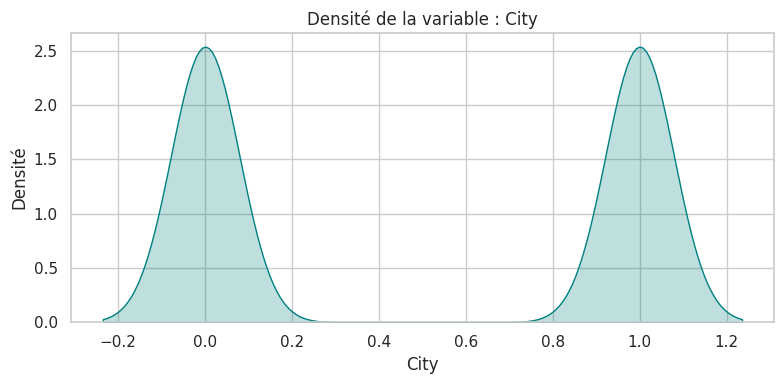

In [ ]:
# Sélectionner les colonnes numériques
numerical_cols = data_finale.select_dtypes(include=['float64', 'int64']).columns

# Style seaborn
sns.set(style="whitegrid")

# Tracer la courbe de densité pour chaque variable
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data_finale, x=col, fill=True, color="teal", bw_adjust=1)
    plt.title(f'Densité de la variable : {col}')
    plt.xlabel(col)
    plt.ylabel('Densité')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

**ANALYSE DESCRIPTIVE ET VISUALISATION**

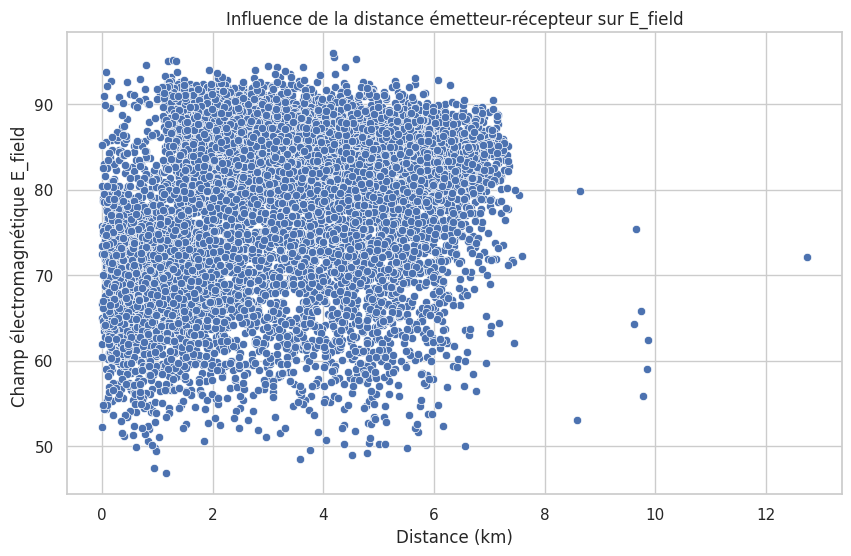

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data_finale, x='Distance', y='E_field')
plt.title("Influence de la distance émetteur-récepteur sur E_field")
plt.xlabel("Distance (km)")
plt.ylabel("Champ électromagnétique E_field ")
plt.grid(True)
plt.show()

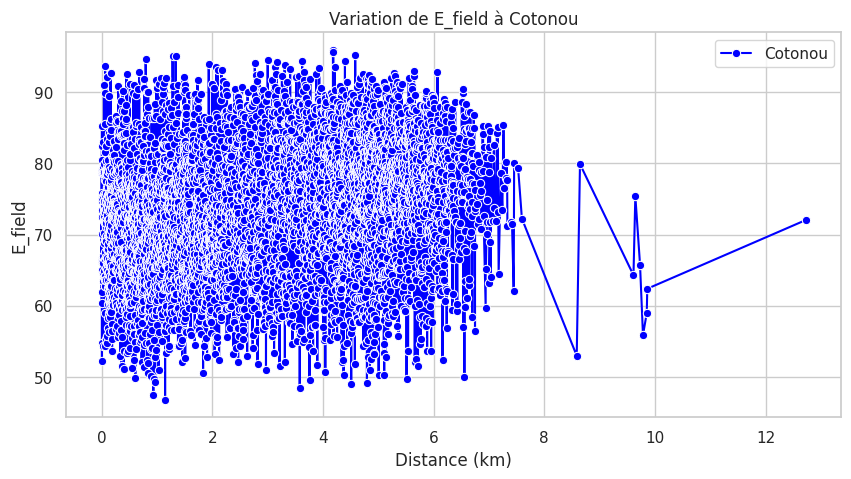

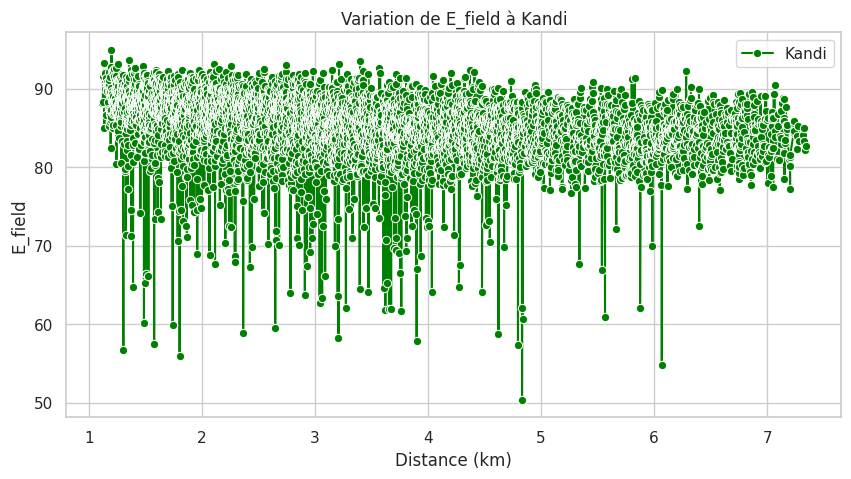

In [ ]:
# Filtrage des données pour Cotonou et Kandi
df_cotonou = data_finale[data_finale['City'] == 0]
df_kandi = data_finale[data_finale['City'] == 1]

# Graphique pour Cotonou
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_cotonou, x='Distance', y='E_field', marker='o', color='blue', label='Cotonou')
plt.title('Variation de E_field à Cotonou')
plt.xlabel('Distance (km)')
plt.ylabel('E_field')
plt.grid(True)
plt.legend()
plt.show()

# Graphique pour Kandi
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_kandi, x='Distance', y='E_field', marker='o', color='green', label='Kandi')
plt.title('Variation de E_field à Kandi')
plt.xlabel('Distance (km)')
plt.ylabel('E_field')
plt.grid(True)
plt.legend()
plt.show()


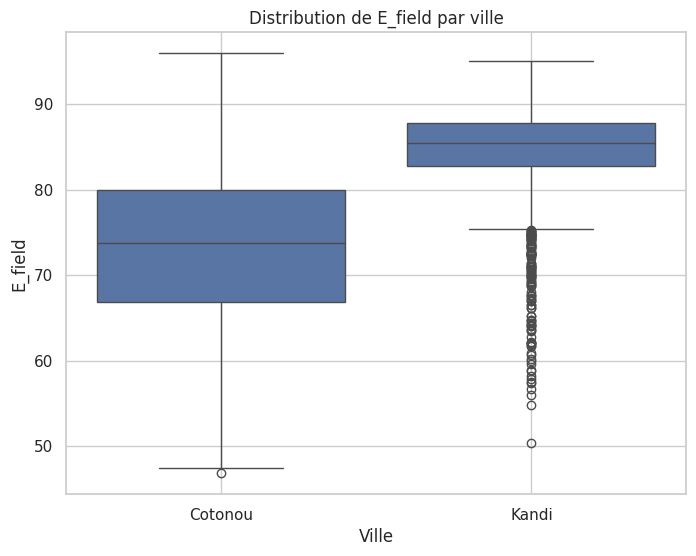

In [ ]:
# Boxplot pour la distribution de E_field par ville
plt.figure(figsize=(8, 6))
sns.boxplot(data=data_finale, x='City', y='E_field')
plt.xticks([0, 1], ['Cotonou', 'Kandi'])
plt.title('Distribution de E_field par ville')
plt.xlabel('Ville')
plt.ylabel('E_field')
plt.grid(True)
plt.show()

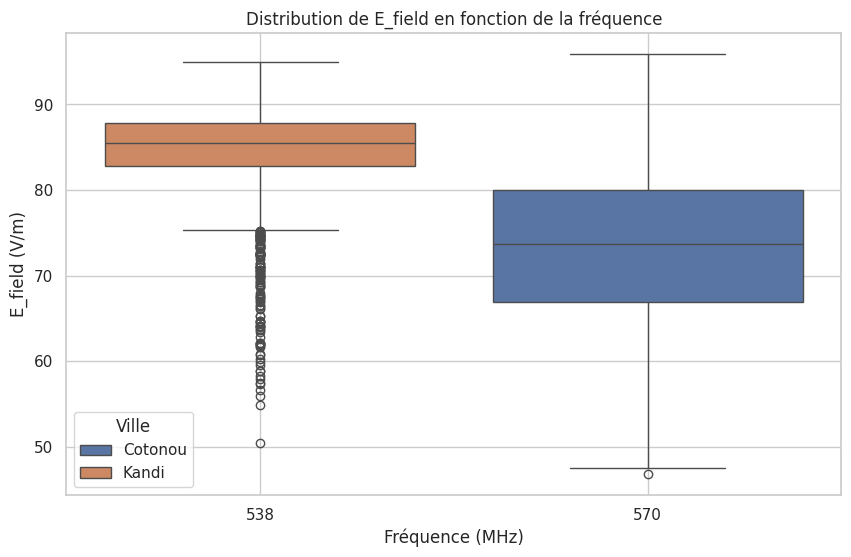

In [ ]:
# Boxplot pour la distribution de E_field par fréquence
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_finale, x='Freq', y='E_field', hue='City')
plt.title('Distribution de E_field en fonction de la fréquence')
plt.xlabel('Fréquence (MHz)')
plt.ylabel('E_field (V/m)')
plt.legend(title='Ville', labels=['Cotonou', 'Kandi'])
plt.grid(True)
plt.show()

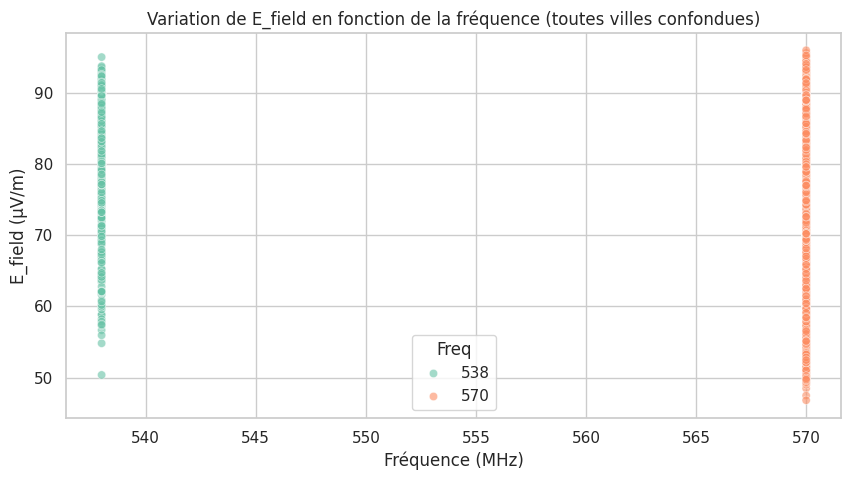

In [ ]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=data_finale, x='Freq', y='E_field', hue='Freq', palette='Set2', alpha=0.6)
plt.title('Variation de E_field en fonction de la fréquence (toutes villes confondues)')
plt.xlabel('Fréquence (MHz)')
plt.ylabel('E_field (µV/m)')
plt.grid(True)
plt.show()

**CORRELATION ENTRE LES VARIABLES**

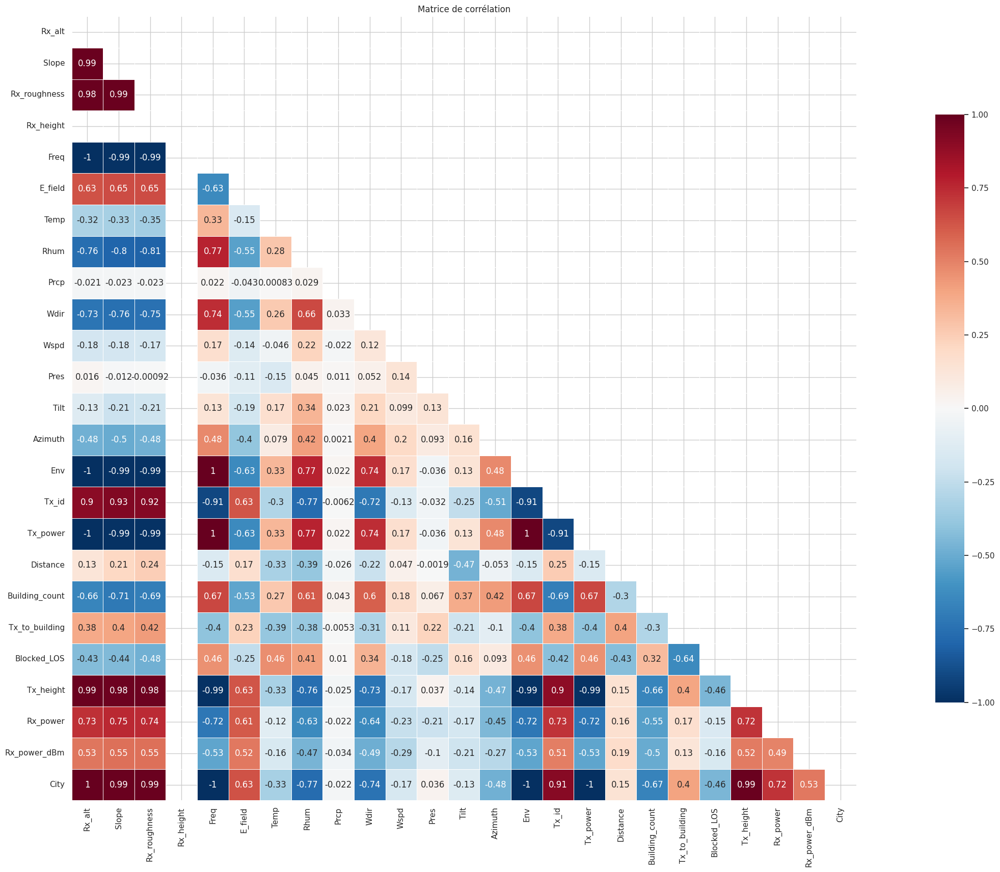

In [ ]:
plt.figure(figsize=(40, 20))
corr = data_finale.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(
    corr, mask=mask, cmap='RdBu_r', annot=True,
    vmin=-1.0, vmax=1.0, center=0,
    square=True, linewidths=0.5, cbar_kws={"shrink": 0.75}
)
plt.title("Matrice de corrélation")
plt.show()

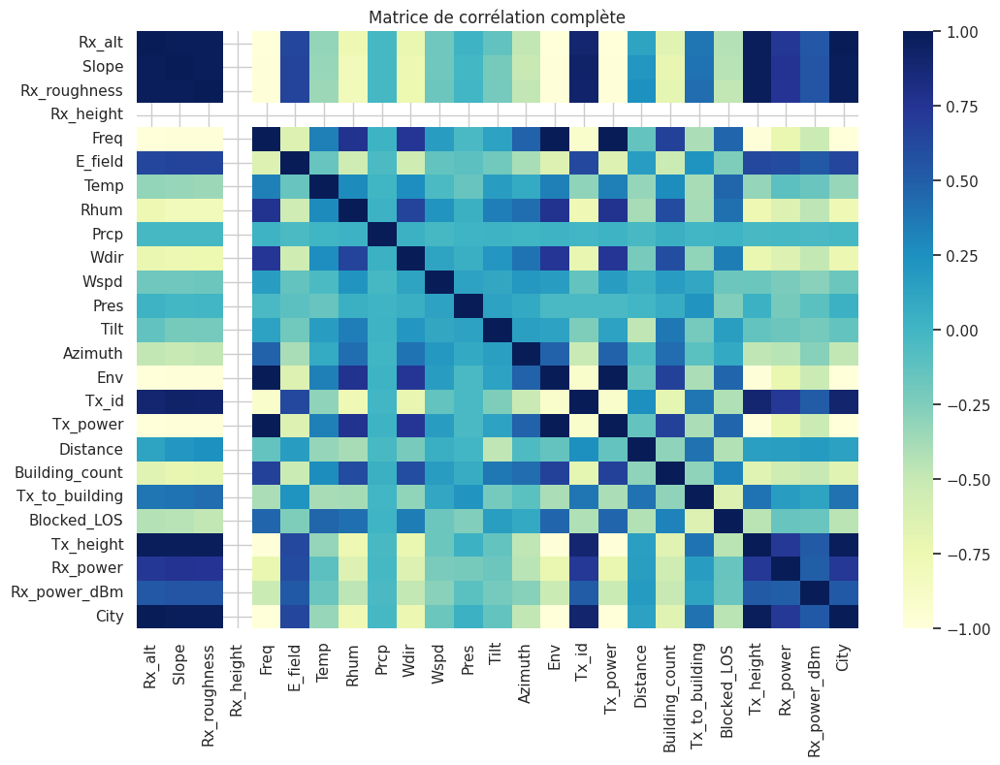

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(data_finale.corr(numeric_only=True), cmap="YlGnBu")
plt.title("Matrice de corrélation complète")
plt.show()

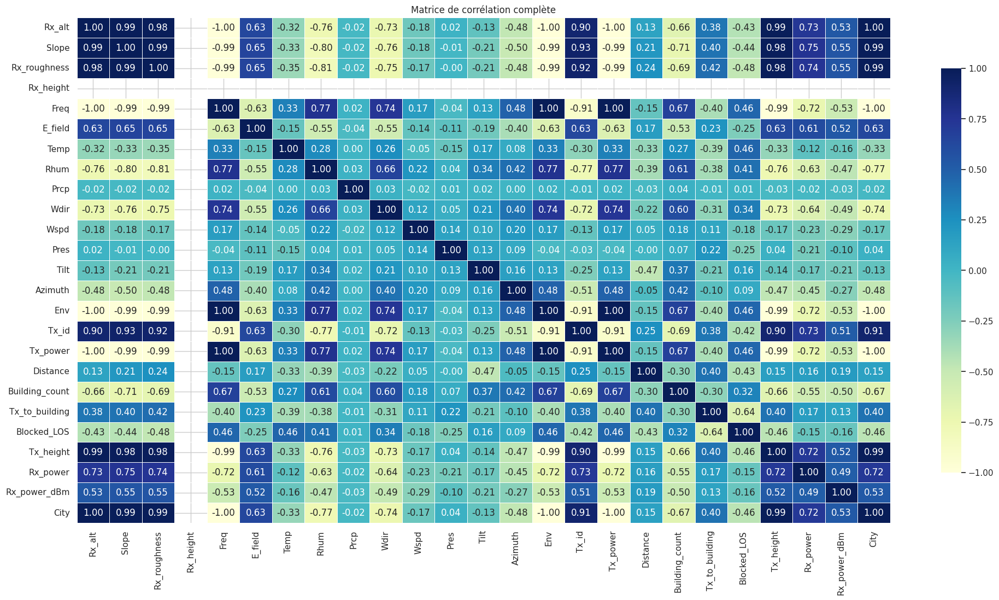

In [ ]:
plt.figure(figsize=(24, 12))
sns.heatmap(
    data_finale.corr(numeric_only=True),
    cmap="YlGnBu",
    annot=True,              # Affiche les coefficients
    fmt=".2f",               # Format des nombres
    linewidths=0.5,          # Lignes entre les cases
    cbar_kws={"shrink": 0.8} # Barre de couleur plus fine
)
plt.title("Matrice de corrélation complète")
plt.show()

**MATRICE DE CORRELATION ENTRE LA VARIABLE CIBLE ET LES VARIABLES NUMERIQUES**

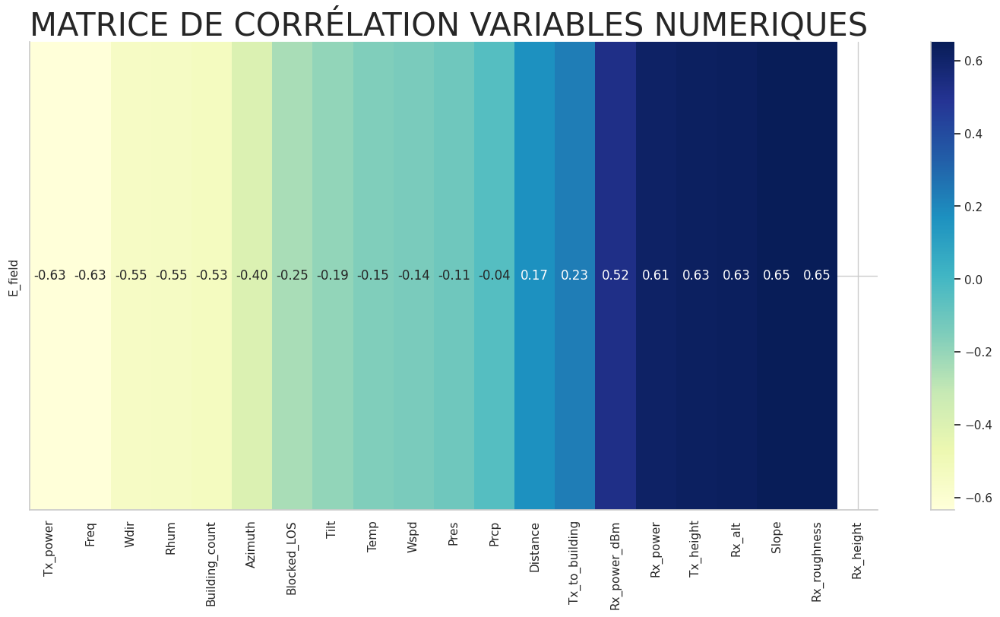

In [ ]:
plt.figure(figsize=(18, 8))

# Calcul de la corrélation avec E_field en excluant les colonnes catégorielles
efield_corr = data_finale.drop(columns=['City', 'Env', 'Tx_id'], errors='ignore') \
    .corr(numeric_only=True)['E_field'] \
    .drop('E_field') \
    .sort_values()

# Affichage sous forme de heatmap horizontale
sns.heatmap(efield_corr.to_frame().T, cmap="YlGnBu", annot=True, fmt=".2f")
plt.title("MATRICE DE CORRÉLATION VARIABLES NUMERIQUES ", fontsize=30)
sns.despine()
plt.show()


**MATRICE DE CORRELATION ENTRE LA VARIABLE CIBLE ET LES VARIABLES CATEGORIELLES**

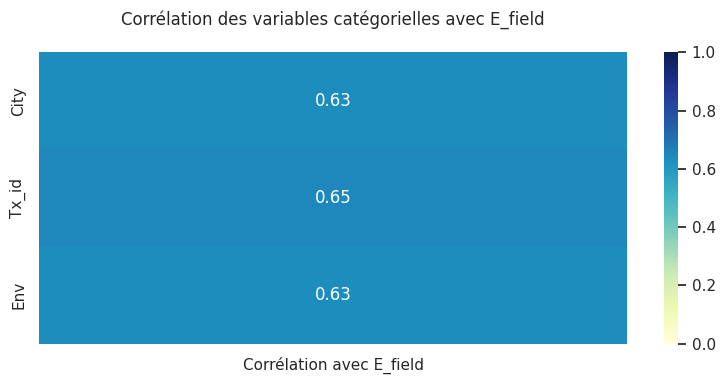

In [ ]:
from scipy.stats import f_oneway

categorical_vars = ['City', 'Tx_id', 'Env']
correlations = {}

for col in categorical_vars:
    groups = [group['E_field'].values for _, group in data_finale.groupby(col)]
    anova_result = f_oneway(*groups)
    ss_between = sum(len(g) * (np.mean(g) - data_finale['E_field'].mean())**2 for g in groups)
    ss_total = sum((data_finale['E_field'] - data_finale['E_field'].mean())**2)
    eta_squared = ss_between / ss_total
    correlations[col] = np.sqrt(eta_squared)  # √η² comme approximation de la corrélation

# Création DataFrame pour heatmap
corr_cat_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Corrélation avec E_field'])

# Visualisation
plt.figure(figsize=(8, 4))
sns.heatmap(corr_cat_df, annot=True, cmap="YlGnBu", vmin=0, vmax=1, fmt=".2f")
plt.title("Corrélation des variables catégorielles avec E_field", pad=20)
plt.tight_layout()
plt.show()


**LISTES DES VARIABLES LES PLUS CORRELEES A LA VARIABLE CIBLE**

In [ ]:
# Calcul des corrélations absolues avec E_field
corr_with_E_field = data_finale.corr(numeric_only=True)['E_field'].abs().sort_values(ascending=False)

# On exclut E_field lui-même en prenant les 24 suivantes
top_corr_vars = corr_with_E_field.index[1:25]

# Affichage
print("Variables les plus corrélées (en valeur absolue) avec E_field :")
print(top_corr_vars.tolist())


Variables les plus corrélées (en valeur absolue) avec E_field :
['Rx_roughness', 'Slope', 'Tx_power', 'Freq', 'Env', 'City', 'Rx_alt', 'Tx_id', 'Tx_height', 'Rx_power', 'Wdir', 'Rhum', 'Building_count', 'Rx_power_dBm', 'Azimuth', 'Blocked_LOS', 'Tx_to_building', 'Tilt', 'Distance', 'Temp', 'Wspd', 'Pres', 'Prcp', 'Rx_height']


In [ ]:
# Calcul des corrélations absolues avec E_field
corr_with_E_field = data_finale.corr(numeric_only=True)['E_field'].abs().sort_values(ascending=False)

# On exclut E_field lui-même en prenant les 24 suivantes
top_corr_vars = corr_with_E_field.index[1:25]

# Affichage avec les valeurs de corrélation entre parenthèses
print("Variables les plus corrélées (en valeur absolue) avec E_field :")
for var in top_corr_vars:
    corr_value = corr_with_E_field[var]
    print(f"{var} ({corr_value:.3f})")

Variables les plus corrélées (en valeur absolue) avec E_field :
Rx_roughness (0.651)
Slope (0.650)
Tx_power (0.634)
Freq (0.634)
Env (0.634)
City (0.634)
Rx_alt (0.633)
Tx_id (0.631)
Tx_height (0.627)
Rx_power (0.614)
Wdir (0.552)
Rhum (0.547)
Building_count (0.529)
Rx_power_dBm (0.524)
Azimuth (0.397)
Blocked_LOS (0.245)
Tx_to_building (0.231)
Tilt (0.195)
Distance (0.165)
Temp (0.153)
Wspd (0.138)
Pres (0.110)
Prcp (0.043)
Rx_height (nan)


**GESTION DES OUTLIERS DANS LA BASE DE DONNEES**

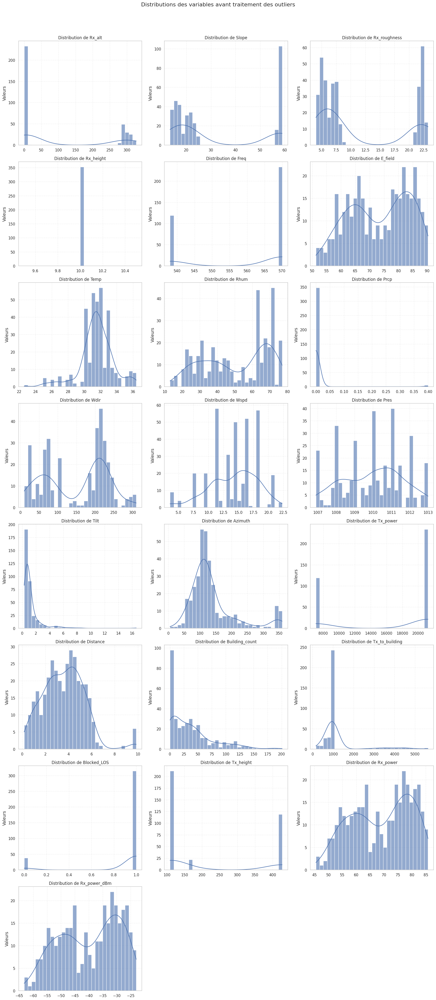

In [ ]:
# Variables à exclure
excluded_columns = ['City', 'Tx_id', 'Env']

# Sélection des colonnes numériques
numeric_cols = [col for col in data_finale.columns
                if col not in excluded_columns
                and pd.api.types.is_numeric_dtype(Data[col])]

# Calcul de la disposition
n_cols = 3  # Nombre de colonnes de graphiques
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols  # Nombre de lignes nécessaires

# Création de la figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
fig.suptitle('Distributions des variables avant traitement des outliers', fontsize=16, y=1.02)

# Remplissage des graphiques
for ax, col in zip(axes.flatten(), numeric_cols):
    sns.histplot(Data[col], kde=True, ax=ax, bins=30, alpha=0.6)
    ax.set_title(f'Distribution de {col}', fontsize=12)
    ax.set_xlabel('')
    ax.set_ylabel('Valeurs')
    ax.grid(True, linestyle='--', alpha=0.3)

# Masquer les axes vides s'il y en a
for i in range(len(numeric_cols), n_rows * n_cols):
    axes.flatten()[i].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
Data_outliers = data_finale.copy()
# Colonnes à exclure du traitement
colonnes_exclues = ['City', 'Tx_id', 'Env']
# Colonnes numériques à traiter
colonnes_a_traiter = [col for col in Data_outliers.columns if col not in colonnes_exclues and pd.api.types.is_numeric_dtype(Data_outliers[col])]

# Appliquer le clipping selon les percentiles
for col in colonnes_a_traiter:
    lower_bound = Data_outliers[col].quantile(0.10)
    upper_bound = Data_outliers[col].quantile(0.90)
    Data_outliers[col] = Data_outliers[col].clip(lower=lower_bound, upper=upper_bound)

# Sauvegarder le résultat
Data_outliers.to_csv("Base_de_données_outliers.csv", index=False)
chemin_fichier = '/gdrive/MyDrive/Résultats TNT/Base_de_données_outliers.csv'
Data_outliers.to_csv(chemin_fichier, index=False)

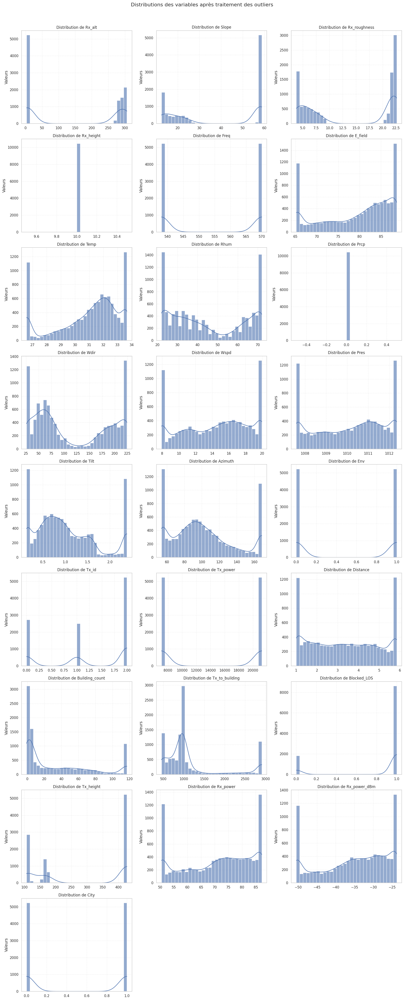

In [ ]:
# Sélection des colonnes
numeric_cols = [col for col in Data_outliers.columns if pd.api.types.is_numeric_dtype(Data_outliers[col])]

# Calcul de la disposition
n_cols = 3  # Nombre de colonnes de graphiques
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols  # Nombre de lignes nécessaires

# Création de la figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()  # Assure que c'est un tableau plat

# Titre global
fig.suptitle('Distributions des variables après traitement des outliers', fontsize=16)

# Remplissage des graphiques
for ax, col in zip(axes, numeric_cols):
    sns.histplot(Data_outliers[col], kde=True, ax=ax, bins=30, alpha=0.6)
    ax.set_title(f'Distribution de {col}', fontsize=12)
    ax.set_xlabel('')
    ax.set_ylabel('Valeurs')
    ax.grid(True, linestyle='--', alpha=0.3)

# Masquer les axes vides s'il y en a
for i in range(len(numeric_cols), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Ajuste pour ne pas écraser le titre
plt.show()


**ANALYSE UNIVARIEE : Détection et suppression des variables peu informatives**

In [ ]:
# Calculer la variance pour chaque colonne numérique
variances = Data_outliers.var(numeric_only=True)

# Afficher les variances
print("Variances pour chaque paramètre :")
print(variances)


Variances pour chaque paramètre :
Rx_alt            2.066617e+04
Slope             4.280671e+02
Rx_roughness      6.937559e+01
Rx_height         0.000000e+00
Freq              2.560245e+02
E_field           6.197227e+01
Temp              4.583036e+00
Rhum              3.356485e+02
Prcp              0.000000e+00
Wdir              5.340074e+03
Wspd              1.510758e+01
Pres              2.526421e+00
Tilt              4.373973e-01
Azimuth           1.201804e+03
Env               2.500239e-01
Tx_id             7.036429e-01
Tx_power          5.012411e+07
Distance          2.604209e+00
Building_count    1.562079e+03
Tx_to_building    5.361987e+05
Blocked_LOS       1.443329e-01
Tx_height         2.175962e+04
Rx_power          1.470658e+02
Rx_power_dBm      7.602868e+01
City              2.500239e-01
dtype: float64


In [ ]:
from sklearn.feature_selection import VarianceThreshold
from scipy.stats import entropy

# === 1. Charger les données ===
df = pd.read_csv('/gdrive/MyDrive/Résultats TNT/Base_de_données_outliers.csv')

# === 2. Paramètres ===
seuil_variance = 0.01         # seuil minimum de variance
seuil_dominance = 0.98        # si une seule valeur domine à 98 % ou plus
seuil_entropie = 0.1          # pour les catégorielles

# === 3. Initialisation ===
colonnes_a_supprimer = []

# === 4. Variables constantes ou quasi constantes ===
for col in df.columns:
    if df[col].nunique() == 1:
        colonnes_a_supprimer.append(col)
    elif df[col].dtype in [np.float64, np.int64]:
        # Vérifie si une valeur domine largement
        top_freq = df[col].value_counts(normalize=True).iloc[0]
        if top_freq >= seuil_dominance:
            colonnes_a_supprimer.append(col)
    elif df[col].dtype == 'object' or df[col].dtype.name == 'category':
        top_freq = df[col].value_counts(normalize=True).iloc[0]
        if top_freq >= seuil_dominance:
            colonnes_a_supprimer.append(col)

# === 5. Faible variance (pour numériques uniquement) ===
colonnes_numeriques = df.select_dtypes(include=[np.number]).columns
var_thresh = VarianceThreshold(threshold=seuil_variance)
var_thresh.fit(df[colonnes_numeriques])
cols_basse_var = [col for col, var in zip(colonnes_numeriques, var_thresh.variances_)
                  if var < seuil_variance]
colonnes_a_supprimer.extend(cols_basse_var)

# === 6. Faible entropie pour catégorielles ===
colonnes_categorielle = df.select_dtypes(include=['object', 'category']).columns
for col in colonnes_categorielle:
    ent = entropy(df[col].value_counts(normalize=True), base=2)
    if ent < seuil_entropie:
        colonnes_a_supprimer.append(col)

# === 7. Nettoyage de la liste (suppression des doublons)
colonnes_a_supprimer = list(set(colonnes_a_supprimer))

# === 8. Affichage
print("🔍 Colonnes détectées comme peu informatives :", colonnes_a_supprimer)
print("📉 Nombre total :", len(colonnes_a_supprimer))

# === 9. Création d'un DataFrame nettoyé
df_filtré = df.drop(columns=colonnes_a_supprimer)

# === 10. Sauvegarde
chemin_sortie = '/gdrive/MyDrive/Résultats TNT/Base_filtrée_univariée.csv'
df_filtré.to_csv(chemin_sortie, index=False)
print("✅ Base filtrée sauvegardée :", chemin_sortie)


🔍 Colonnes détectées comme peu informatives : ['Rx_height', 'Prcp']
📉 Nombre total : 2
✅ Base filtrée sauvegardée : /gdrive/MyDrive/Résultats TNT/Base_filtrée_univariée.csv


**STANDARDISATION DE LA BASE DE DONNEES AVEC Z-SCORE**

In [ ]:
# Liste des colonnes à exclure de la standardisation
colonnes_a_exclure = ['City', 'Tx_id', 'Env']

# Sélection des colonnes numériques uniquement parmi celles non exclues
colonnes_a_standardiser = [col for col in df_filtré.columns
                           if col not in colonnes_a_exclure and pd.api.types.is_numeric_dtype(df_filtré[col])]

# Création d'une copie pour ne pas modifier l'original (optionnel mais recommandé)
Data_standardisé = df_filtré.copy()

# Application de la standardisation
scaler = StandardScaler()
Data_standardisé[colonnes_a_standardiser] = scaler.fit_transform(Data_standardisé[colonnes_a_standardiser])

# Sauvegarde des données standardisées dans Google Drive
chemin_sortie = '/gdrive/MyDrive/Résultats TNT/Data_standardisé.csv'
Data_standardisé.to_csv(chemin_sortie, index=False)

print(" Données standardisées avec Z-score sauvegardées dans :", chemin_sortie)


 Données standardisées avec Z-score sauvegardées dans : /gdrive/MyDrive/Résultats TNT/Data_standardisé.csv


**ANALYSE BIVARIEE**

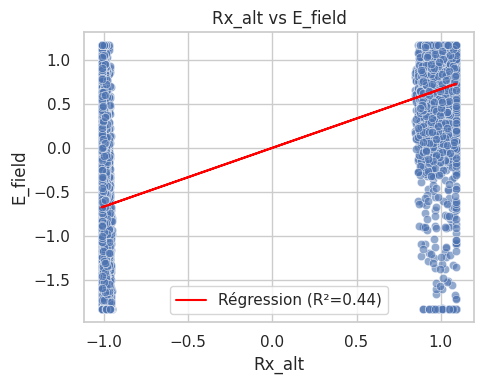

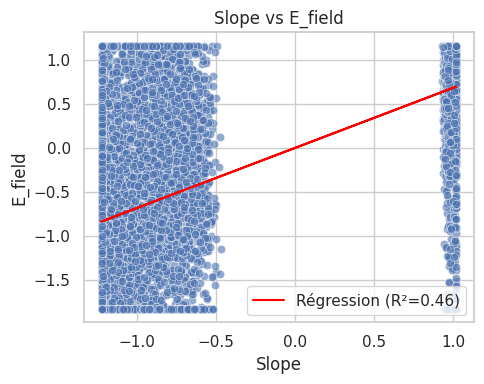

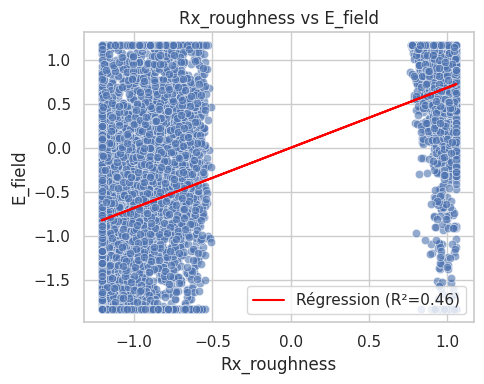

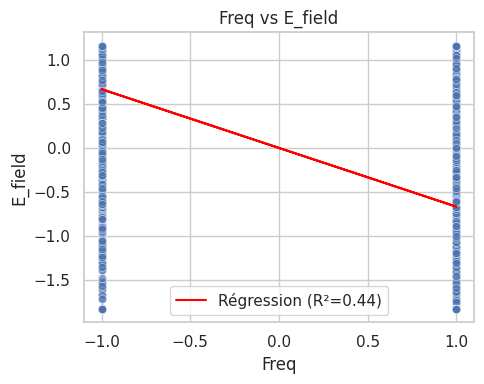

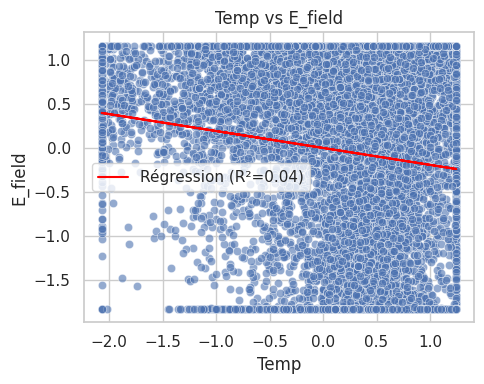

...

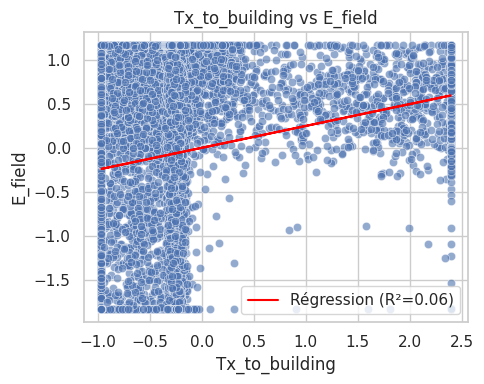

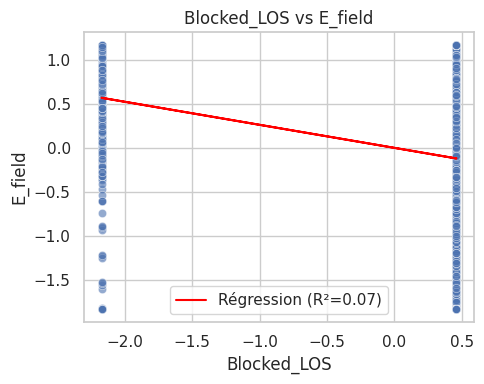

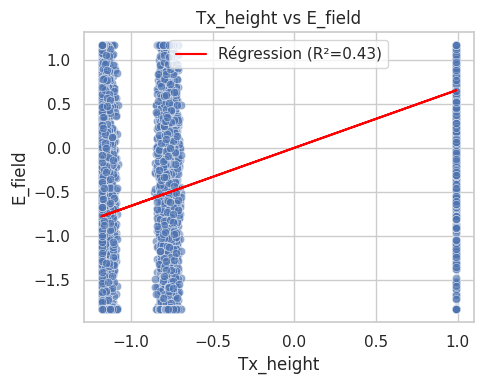

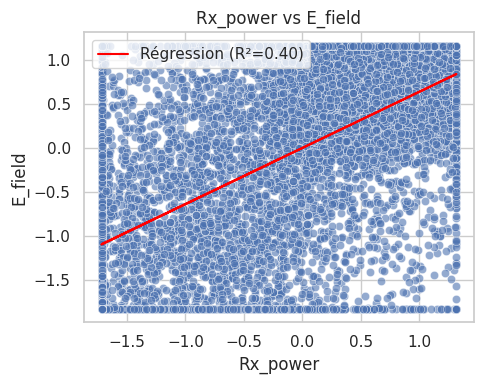

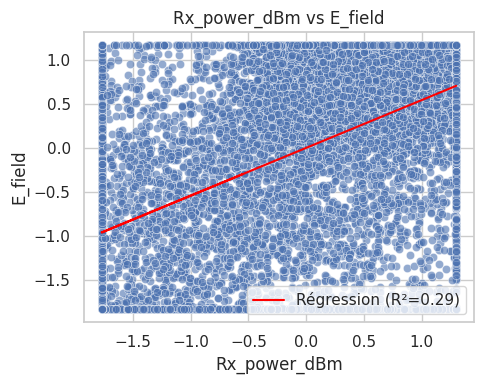

📊 Résultats de l’analyse bivariée :

          Variable  Coefficient        R²
1            Slope     0.681512  0.464458
2     Rx_roughness     0.681220  0.464061
3             Freq    -0.664615  0.441713
11        Tx_power    -0.664615  0.441713
0           Rx_alt     0.664570  0.441653
16       Tx_height     0.658291  0.433347
17        Rx_power     0.635707  0.404123
6             Wdir    -0.608340  0.370077
13  Building_count    -0.591044  0.349333
5             Rhum    -0.581700  0.338375
18    Rx_power_dBm     0.541828  0.293578
10         Azimuth    -0.462917  0.214292
15     Blocked_LOS    -0.260997  0.068120
14  Tx_to_building     0.248182  0.061594
4             Temp    -0.191577  0.036702
9             Tilt    -0.164891  0.027189
12        Distance     0.158613  0.025158
7             Wspd    -0.120309  0.014474
8             Pres    -0.092707  0.008595
✅ Variables sélectionnées (R² ≥ 0.05 ) :
['Slope', 'Rx_roughness', 'Freq', 'Tx_power', 'Rx_alt', 'Tx_height', 'Rx_power', '

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# 1. Chargement des données
df = Data_standardisé.copy()  # ou Data_outliers selon ton choix

# 2. Cible et exclusion des variables catégorielles
target = 'E_field'
colonnes_categorielle = ['City', 'Tx_id', 'Env']
X = df.drop(columns=colonnes_categorielle + [target])
y = df[target]

# 3. Régression simple + collecte des résultats
resultats = []

for col in X.columns:
    model = LinearRegression()
    X_col = X[[col]]
    model.fit(X_col, y)
    y_pred = model.predict(X_col)
    coef = model.coef_[0]
    r2 = r2_score(y, y_pred)
    resultats.append((col, coef, r2))

    # Visualisation
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x=X_col[col], y=y, alpha=0.6)
    plt.plot(X_col[col], y_pred, color='red', label=f"Régression (R²={r2:.2f})")
    plt.title(f"{col} vs E_field")
    plt.xlabel(col)
    plt.ylabel("E_field")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 4. Résultats et sélection automatique
df_resultats = pd.DataFrame(resultats, columns=["Variable", "Coefficient", "R²"])
df_resultats = df_resultats.sort_values(by="R²", ascending=False)

# 5. Seuil de sélection automatique
seuil_r2 = 0.05  # Modifie ce seuil selon ton besoin
variables_selectionnees = df_resultats[df_resultats["R²"] >= seuil_r2]["Variable"].tolist()

print("📊 Résultats de l’analyse bivariée :\n")
print(df_resultats)
print("✅ Variables sélectionnées (R² ≥", seuil_r2, ") :")
print(variables_selectionnees)

# 6. Création du nouveau jeu de données réduit
#X_selectionne = df[variables_selectionnees + [target]]

# 7. Sauvegarde
#chemin_sortie = "/gdrive/MyDrive/RESULTATS TNT/Data_variables_selectionnees.csv"
#X_selectionne.to_csv(chemin_sortie, index=False)
#print(f"📁 Données sauvegardées avec {len(variables_selectionnees)} variables dans :\n{chemin_sortie}")


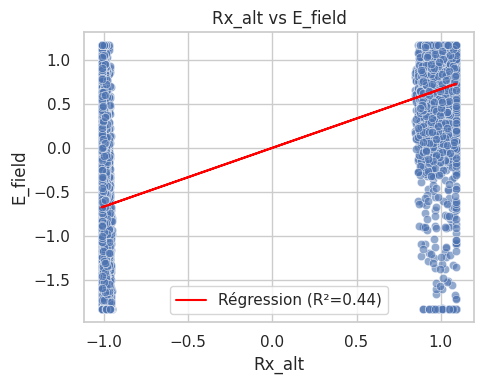

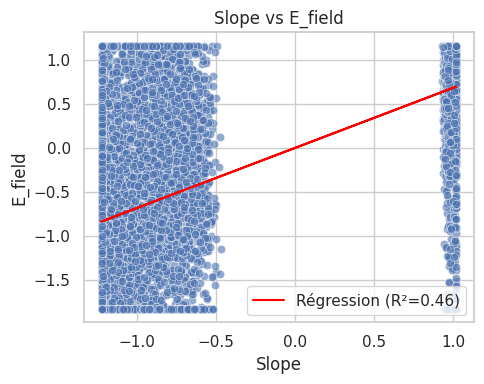

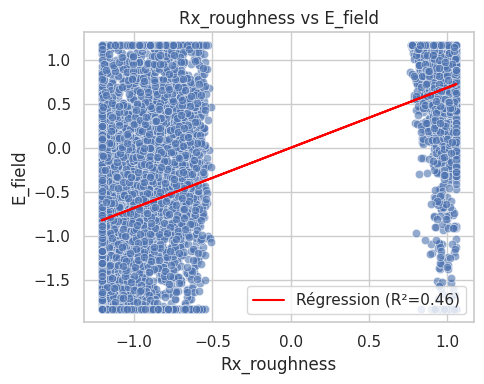

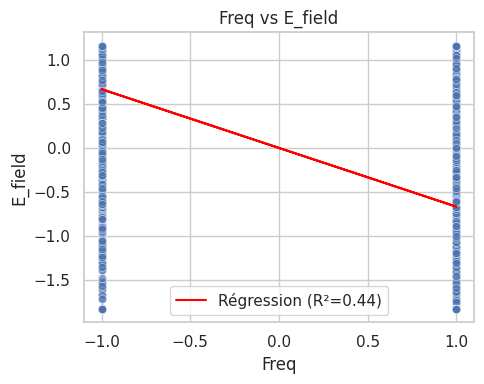

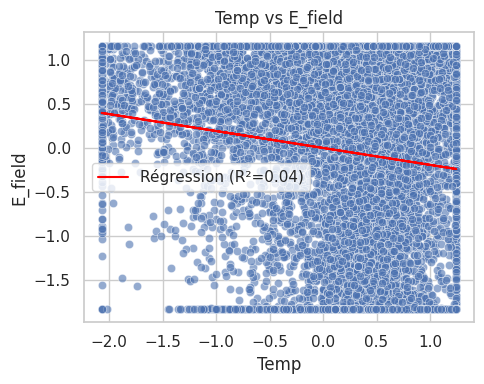

...

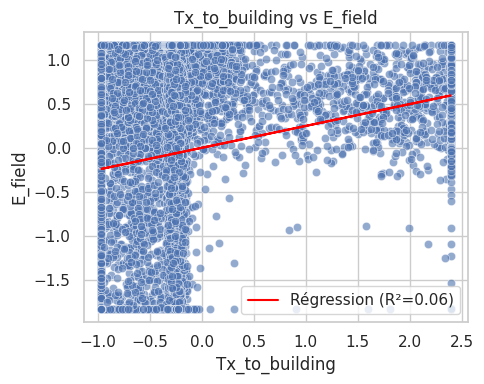

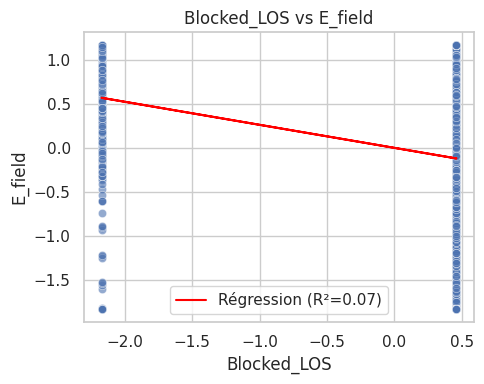

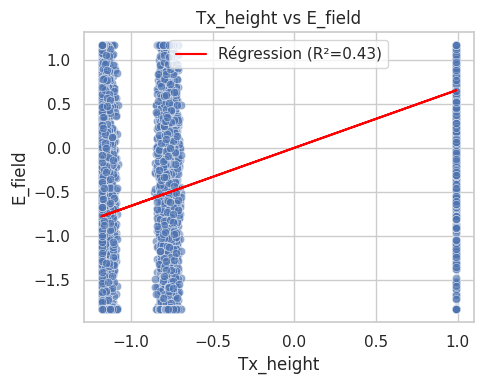

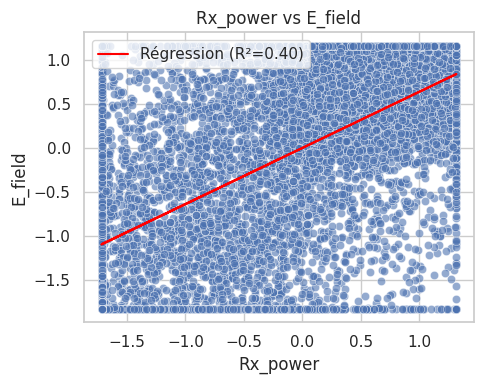

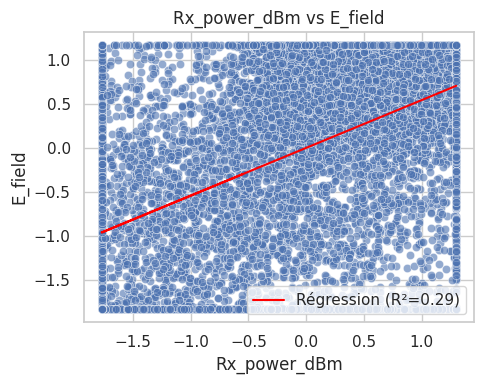


📊 Résultats régression simple (variables numériques) :
          Variable  Coefficient        R²
1            Slope     0.681512  0.464458
2     Rx_roughness     0.681220  0.464061
3             Freq    -0.664615  0.441713
11        Tx_power    -0.664615  0.441713
0           Rx_alt     0.664570  0.441653
16       Tx_height     0.658291  0.433347
17        Rx_power     0.635707  0.404123
6             Wdir    -0.608340  0.370077
13  Building_count    -0.591044  0.349333
5             Rhum    -0.581700  0.338375
18    Rx_power_dBm     0.541828  0.293578
10         Azimuth    -0.462917  0.214292
15     Blocked_LOS    -0.260997  0.068120
14  Tx_to_building     0.248182  0.061594
4             Temp    -0.191577  0.036702
9             Tilt    -0.164891  0.027189
12        Distance     0.158613  0.025158
7             Wspd    -0.120309  0.014474
8             Pres    -0.092707  0.008595

✅ Variables numériques retenues (R² ≥ 0.05):
['Slope', 'Rx_roughness', 'Freq', 'Tx_power', 'Rx_alt', 'T

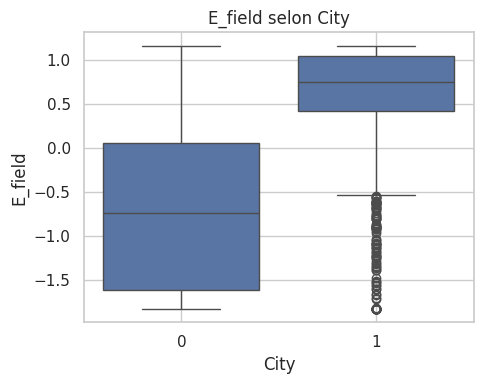

→ Tx_id | F = 4441.109, p = 0.0000


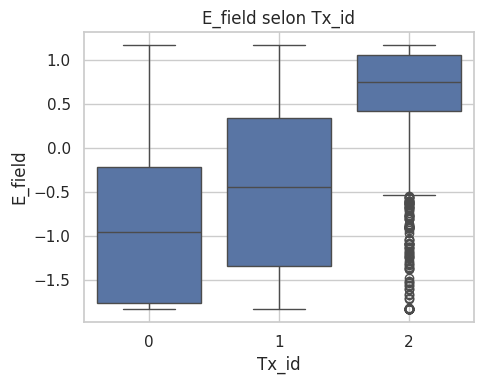

→ Env | F = 8280.646, p = 0.0000


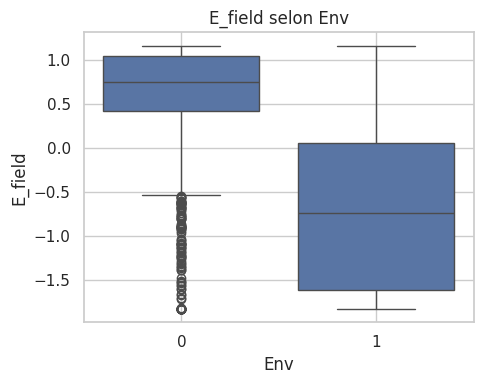


✅ Variables catégorielles retenues (p ≤ 0.05):
['City', 'Tx_id', 'Env']

📁 Données sauvegardées (17 variables sélectionnées) dans :
/gdrive/MyDrive/Résultats TNT/Data_variables_selectionnees.csv


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import f_oneway

# === 1. Chargement des données ===
df = Data_standardisé.copy()  # ou Data_outliers selon ton étape
target = 'E_field'
colonnes_categorielle = ['City', 'Tx_id', 'Env']

# === 2. Variables numériques (hors catégorielles + target) ===
X_num = df.drop(columns=colonnes_categorielle + [target])
y = df[target]

# === 3. Régression linéaire simple : variables numériques ===
resultats = []
seuil_r2 = 0.05  # seuil minimum d'importance

for col in X_num.columns:
    model = LinearRegression()
    X_col = X_num[[col]]
    model.fit(X_col, y)
    y_pred = model.predict(X_col)
    coef = model.coef_[0]
    r2 = r2_score(y, y_pred)
    resultats.append((col, coef, r2))

    # Visualisation
    plt.figure(figsize=(5, 4))
    sns.scatterplot(x=X_col[col], y=y, alpha=0.6)
    plt.plot(X_col[col], y_pred, color='red', label=f"Régression (R²={r2:.2f})")
    plt.title(f"{col} vs E_field")
    plt.xlabel(col)
    plt.ylabel("E_field")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Résumé et sélection
df_resultats = pd.DataFrame(resultats, columns=["Variable", "Coefficient", "R²"])
df_resultats = df_resultats.sort_values(by="R²", ascending=False)

variables_num_select = df_resultats[df_resultats["R²"] >= seuil_r2]["Variable"].tolist()

print("\n📊 Résultats régression simple (variables numériques) :")
print(df_resultats)
print(f"\n✅ Variables numériques retenues (R² ≥ {seuil_r2}):")
print(variables_num_select)

# === 4. Analyse ANOVA sur variables catégorielles ===
seuil_pval = 0.05  # seuil de significativité
variables_cat_select = []

print("\n🔍 Analyse ANOVA (variables catégorielles) :")
for cat in colonnes_categorielle:
    groupes = [group[target].values for name, group in df.groupby(cat)]
    stat, pval = f_oneway(*groupes)
    print(f"→ {cat} | F = {stat:.3f}, p = {pval:.4f}")
    if pval <= seuil_pval:
        variables_cat_select.append(cat)

    # Boxplot
    plt.figure(figsize=(5, 4))
    sns.boxplot(x=cat, y=target, data=df)
    plt.title(f"E_field selon {cat}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

print(f"\n✅ Variables catégorielles retenues (p ≤ {seuil_pval}):")
print(variables_cat_select)

# === 5. Fusion des variables sélectionnées ===
variables_finales = variables_num_select + variables_cat_select
df_selectionne = df[variables_finales + [target]]

# === 6. Sauvegarde ===
chemin = "/gdrive/MyDrive/Résultats TNT/Data_variables_selectionnees.csv"
df_selectionne.to_csv(chemin, index=False)
print(f"\n📁 Données sauvegardées ({len(variables_finales)} variables sélectionnées) dans :\n{chemin}")


**SELECTION DES VARIABLES AVEC PCA**

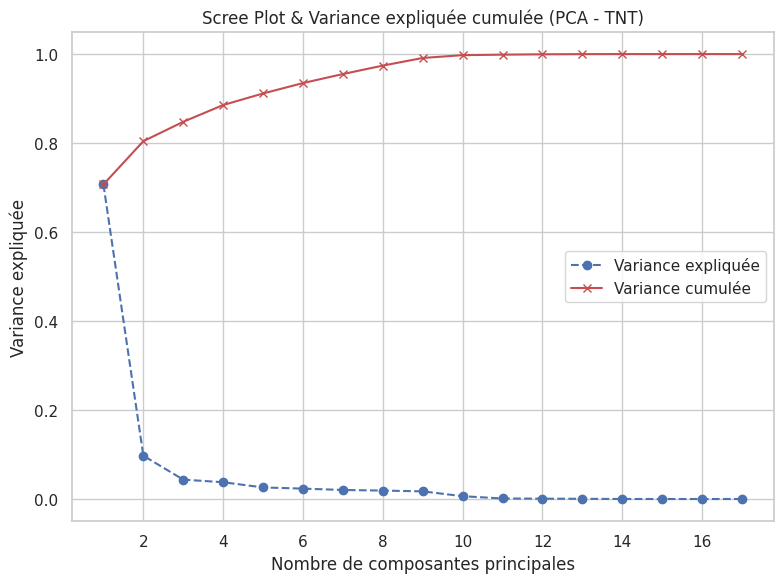

Variance cumulée pour chaque composante :
[0.70700079 0.80426698 0.84780418 0.88551486 0.91149324 0.93484053
 0.9551532  0.97409459 0.99126847 0.99756294 0.99871438 0.99947602
 0.99991208 1.         1.         1.         1.        ]


In [ ]:
from sklearn.decomposition import PCA
# Appliquer PCA sur les données standardisées (en excluant la colonne 'E_field' qui est la variable cible)
X_standardisé = df_selectionne.drop(columns=['E_field'])  # Les données doivent être déjà standardisées
pca_tnt = PCA()
pca_tnt.fit(X_standardisé)

# Variance expliquée par chaque composante
explained_variance = pca_tnt.explained_variance_ratio_

# Variance expliquée cumulée
cumulative_variance = explained_variance.cumsum()

# Créer le scree plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--', color='b', label='Variance expliquée')
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='x', linestyle='-', color='r', label='Variance cumulée')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée')
plt.title('Scree Plot & Variance expliquée cumulée (PCA - TNT)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Afficher la variance cumulée pour chaque composante
print("Variance cumulée pour chaque composante :")
print(cumulative_variance)

Nombre optimal de composantes : 8


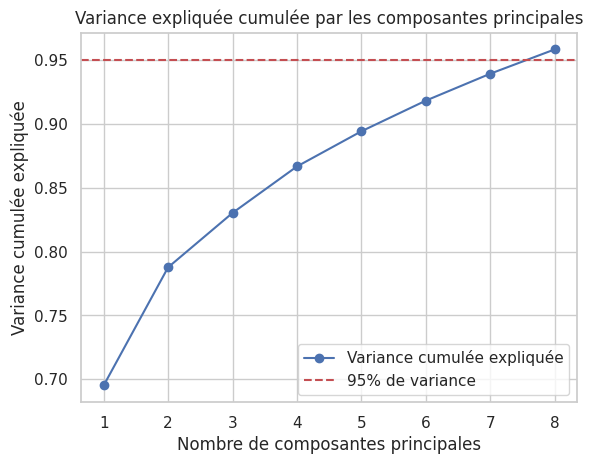

In [ ]:
# Sélection du nombre optimal de PCs (variance cumulée > 95%)
pca_temp = PCA()
pca_temp.fit(df_selectionne)  # On ajuste la PCA d'abord
n_components = np.argmax(pca_temp.explained_variance_ratio_.cumsum() >= 0.95) + 1
print(f"Nombre optimal de composantes : {n_components}")

# Réapplication de la PCA avec ce nombre
pca_optimale = PCA(n_components=n_components)
X_pca_reduit = pca_optimale.fit_transform(df_selectionne)

# Calcul de la variance cumulée pour le graphique
cumulative_variance = pca_optimale.explained_variance_ratio_.cumsum()

# Création du graphique
plt.plot(range(1, n_components + 1), cumulative_variance, 'o-', label='Variance cumulée expliquée')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de variance')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance cumulée expliquée')
plt.title('Variance expliquée cumulée par les composantes principales')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# 1. Séparer les variables explicatives et la cible
X = df_selectionne.drop(columns=['E_field'])
y = df_selectionne['E_field']

# 2. Appliquer PCA avec n_components=8
pca = PCA(n_components=8)
X_pca = pca.fit_transform(X)

# 3. Calculer les loadings
loadings = pd.DataFrame(pca.components_.T, index=X.columns, columns=[f'PC{i+1}' for i in range(8)])

# 4. Identifier les variables les plus contributives (uniques)
top_variables = []
for i in range(8):
    var = loadings.iloc[:, i].abs().idxmax()
    if var not in top_variables:
        top_variables.append(var)
    if len(top_variables) == 8:
        break

explained_var = pca.explained_variance_ratio_
print(f"Variance expliquée par les 8 composantes : {explained_var.sum():.2%}")
print("Variables uniques les plus contributives conservées :")
print(top_variables)

Variance expliquée par les 8 composantes : 97.41%
Variables uniques les plus contributives conservées :
['Slope', 'Tx_to_building', 'Rx_power_dBm', 'Azimuth', 'Rhum', 'Building_count', 'Blocked_LOS']


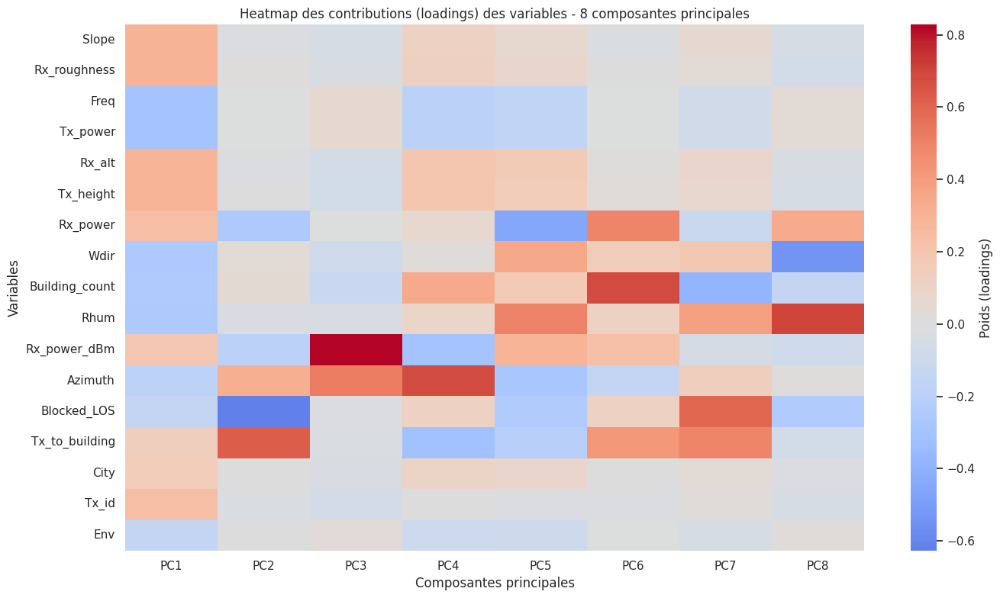

In [ ]:
# Recalculer les loadings avec 8 composantes
loadings = pd.DataFrame(pca.components_.T, index=X.columns, columns=[f'PC{i+1}' for i in range(8)])

plt.figure(figsize=(14, 8))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=False, cbar_kws={'label': 'Poids (loadings)'})
plt.title("Heatmap des contributions (loadings) des variables - 8 composantes principales")
plt.xlabel("Composantes principales")
plt.ylabel("Variables")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.decomposition import PCA

# 1. Application de la PCA sur les variables sélectionnées
pca_finale = PCA(n_components=n_components)
X_pca_reduit = pca_finale.fit_transform(df_selectionne)

# 2. Créer un DataFrame avec les composantes principales
colonnes_pca = [f'PC{i+1}' for i in range(n_components)]
df_pca = pd.DataFrame(X_pca_reduit, columns=colonnes_pca)

# 3. Ajouter la variable cible (E_field)
df_pca['E_field'] = df[target].values

# 4. Sauvegarde de la nouvelle base PCA
chemin_sauvegarde = "/gdrive/MyDrive/Résultats TNT/Data_PCA.csv"
df_pca.to_csv(chemin_sauvegarde, index=False)

print(f"✅ Base de données PCA prête pour l'entraînement. Sauvegardée ici :\n{chemin_sauvegarde}")


✅ Base de données PCA prête pour l'entraînement. Sauvegardée ici :
/gdrive/MyDrive/Résultats TNT/Data_PCA.csv
